# Initial setup

## Importing libraries

In [126]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.stats as st
import scipy as sp
from sklearn import ensemble, tree, linear_model
import missingno as msno
import os
import plotly.express as px
import warnings
from datetime import date, datetime
from scipy.stats.mstats import winsorize
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler # Import StandardScaler from sklearn.preprocessing
from sklearn.cluster import KMeans
from sklearn.feature_selection import f_regression
import math
from statsmodels.stats.diagnostic import normal_ad
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson

## Importing dataset

In [127]:
from os.path import dirname, join

# dirname(os.getcwd())
def path():
    return "assets/" if os.name == 'posix' else "assets\\"

data_filename = "AB_NYC_2019.csv"
absolute_data_file_path = join(dirname(os.getcwd()), path(), data_filename)
data = pd.read_csv(absolute_data_file_path)
print(f"The dataset file is: {os.path.getsize(absolute_data_file_path)/(1<<20):,.2f}MB")

data_raw=data

The dataset file is: 6.75MB


# Exploratory Data Analysis

## General dataset exploration

In [128]:
# 2-dimension shape
print(f"Number of rows is {data.shape[0]} and columns is {data.shape[1]}")


Number of rows is 48895 and columns is 16


In [129]:
# General information about each variable
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

The dataset includes the following variables:
- id: individual listing id (integer)
- name: individual listing name (string)
- host_id: individual host id (integer)
- host_name: individual host name (string)
- neighbourhood_group: high-level neighbourhood group (string)
- neighbourhood: specific neighbourhood
- latitude: latitude (numeric)
- longitude: longitude (numeric)
- room_type: room type (string)
- price: listing price in dollars (integer)
- minimum_nights: minimum number of nights per booking (integer)
- number_of_reviews: total number of reviews for specific listing (integer)
- last_review: date of last review for specific listing (string)
- reviews_per_month: average number of monthly reviews for specific listing (numeric)
- calculated_host_listings_count: total number of listings per host (integer)
- availability_365: number of days listing is available over the year (integer)

In [130]:
# Top 6 rows
data.head()


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [131]:
# Bottom 6 rows

data.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2
48894,36487245,Trendy duplex in the very heart of Hell's Kitchen,68119814,Christophe,Manhattan,Hell's Kitchen,40.76404,-73.98933,Private room,90,7,0,NaN,NaN,1,23


#### Visualising distribution of missing values in the dataset

<Axes: >

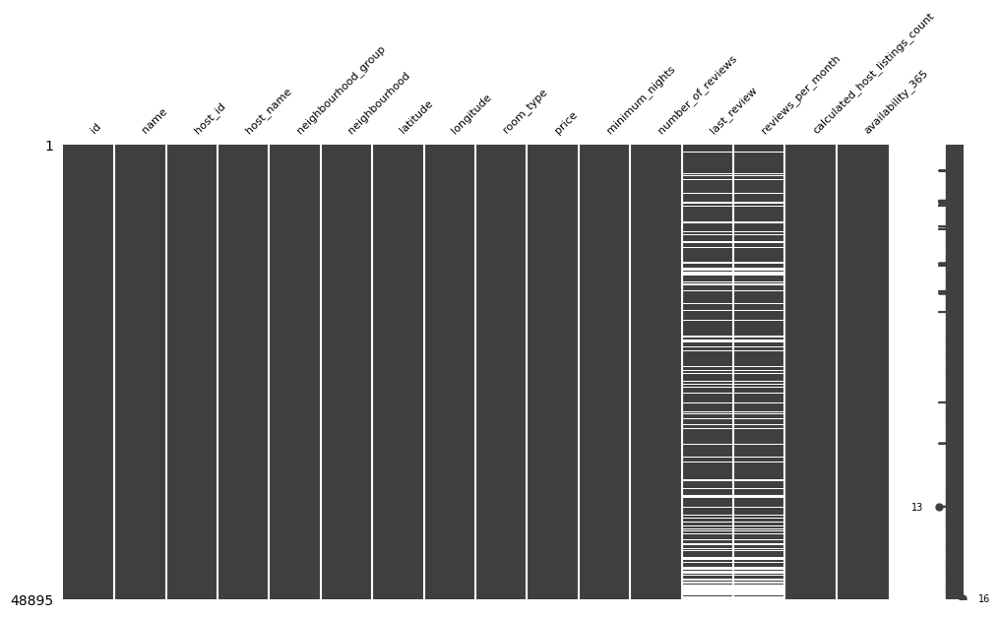

In [132]:
msno.matrix(data,figsize=(12,6), fontsize=8)

<Axes: >

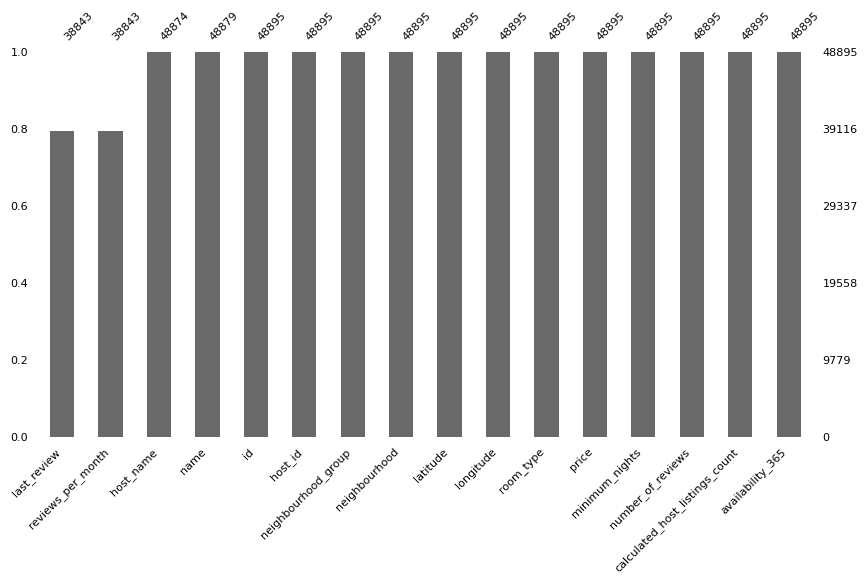

In [133]:
msno.bar(data, figsize=(10,5), fontsize=8, sort="ascending")

In [134]:
# Number and proportion of missing values per variable (%)
values = data.isnull().sum()
percent = data.isnull().sum() / data.shape[0] * 100

list=[]
for key, value in values.items():
    list.append([key,value, percent[key]])
df = pd.DataFrame(list, columns=['Feature', 'sum', 'pct %'])
df

,Feature,sum,pct %
0,id,0,0.000000
1,name,16,0.032723
2,host_id,0,0.000000
3,host_name,21,0.042949
4,neighbourhood_group,0,0.000000
5,neighbourhood,0,0.000000
6,latitude,0,0.000000
7,longitude,0,0.000000
8,room_type,0,0.000000
9,price,0,0.000000


Most variables do not have missing values, except name (0.03% missing), host_name (0.04%), and reviews_per_month and last_review (20.6% each, representing listings with 0 reviews)

In [135]:
# Descriptive statistics across the entire dataset (for numeric variables only, excluding those which do not strictly contain numeric information)
data.describe().drop(['id', 'host_id', 'latitude', 'longitude'], axis=1).round(1)

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.0,48895.0,48895.0,38843.0,48895.0,48895.0
mean,152.7,7.0,23.3,1.4,7.1,112.8
std,240.2,20.5,44.6,1.7,33.0,131.6
min,0.0,1.0,0.0,0.0,1.0,0.0
25%,69.0,1.0,1.0,0.2,1.0,0.0
50%,106.0,3.0,5.0,0.7,1.0,45.0
75%,175.0,5.0,24.0,2.0,2.0,227.0
max,10000.0,1250.0,629.0,58.5,327.0,365.0


## Univariate data exploration (individual variables)

Based on the initial exploration of the first six rows, variables id, name, host_id, host_name will not be assessed as they are unlikely to be informative (although some useful insights could be extracted from listing name using NLP tools).

### Host id


In [136]:
print(f"There are {len(data.host_id.unique())} unique host ids")


There are 37457 unique host ids


### Neighbourhood group

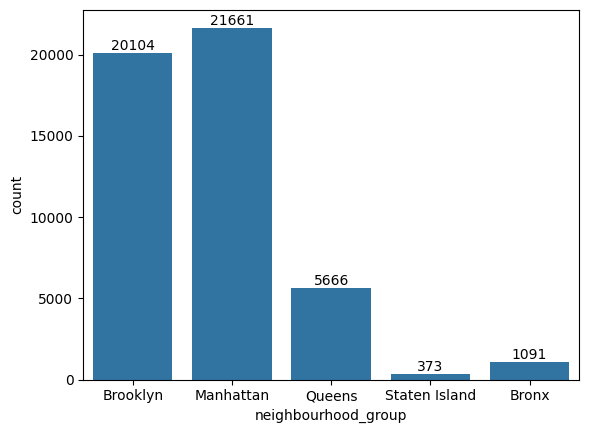

In [137]:
# data.neighbourhood_group.value_counts()

ax=sns.countplot(data,
              x="neighbourhood_group",
            #   order = data.neighbourhood_group.value_counts().index,
              dodge=False)

for i in ax.containers:
    ax.bar_label(i,)

Most listings are in Manhattan (21661) and Brooklyn (20104), followed by Queens (5666), Bronx (1091) and Staten Island (373).


### Neighbourhood

In [138]:
print(f"There are {len(data.neighbourhood.unique())} unique neighbourhoods.")


There are 221 unique neighbourhoods.


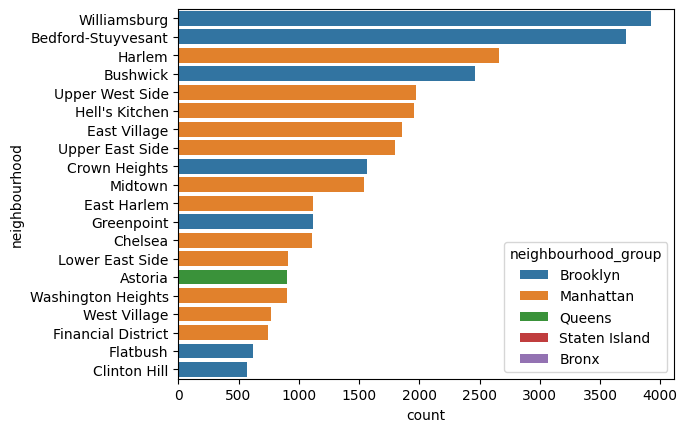

In [139]:
# Show 20 most common neighbourhoods

ax=sns.countplot(data,
              y="neighbourhood",
              hue="neighbourhood_group",
              order = data.neighbourhood.value_counts().iloc[:20].index,
              dodge=False)




### Latitude and longitude

In [140]:
fig = px.scatter_mapbox(data,
                        lat="latitude",
                        lon="longitude",
                        hover_name="name",
                        hover_data=["room_type", "id","price"],
                        color="price",
                        # color_continuous_scale=color_scale,
                        size="price",
                        zoom=10,
                        height=800,
                        width=1000
                        )

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

This map shows the geographical location of each listing, with size varying based on price, and color assigned by neighbourhood group. Hovering over each point provides some information about that listing.

### Room type

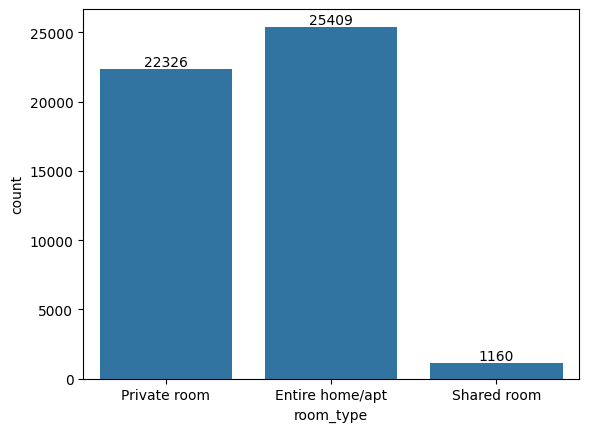

In [141]:
# data.room_type.value_counts()

ax=sns.countplot(data,
              x="room_type",
            #   order = data.room_type.value_counts().index,
              dodge=False)

for i in ax.containers:
    ax.bar_label(i,)

### Price

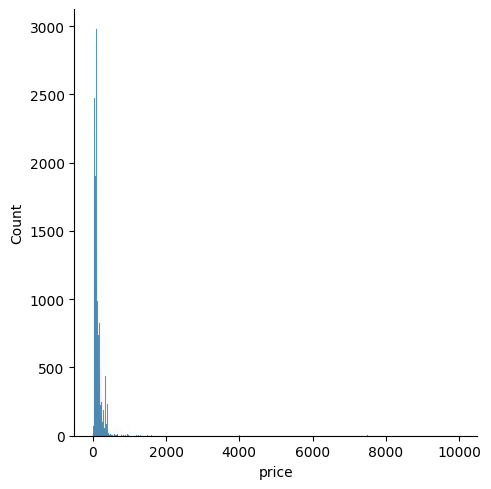

In [142]:
# density plot
sns.displot(data, x="price")
plt.show()

The data is heavily right-skewed, and does not follow a normal distribution. A log-normal distribution may be achieved by applying a log10 transformation

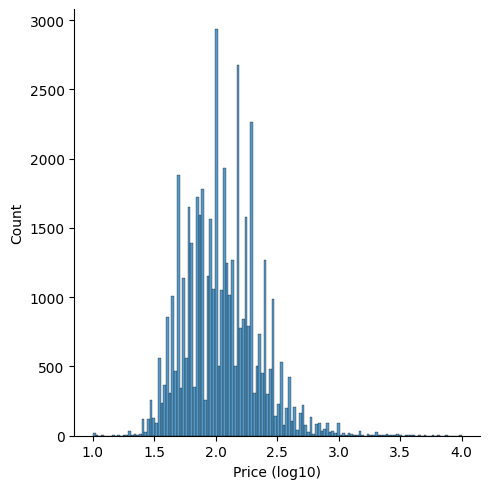

In [143]:
# density plot after log10 transformation
warnings.filterwarnings('ignore')

sns.displot(x=np.log10(data["price"]))
plt.xlabel("Price (log10)")
plt.show()



Distribution now closer to normal, particularly up to ~10^3 (1,000)

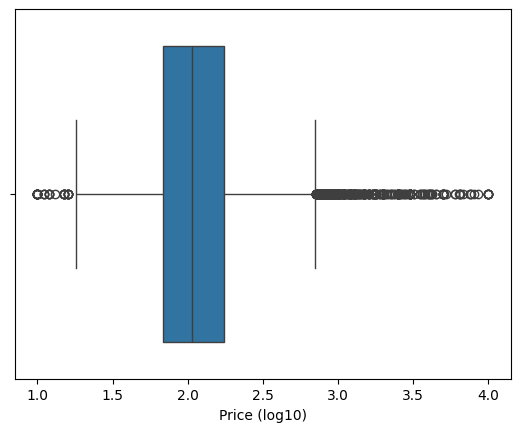

In [144]:
# boxplot after log10 transformation
warnings.filterwarnings('ignore')

sns.boxplot(x=np.log10(data["price"]))
plt.xlabel("Price (log10)")
plt.show()

The log10-transformed boxplot suggests that any values above 10^2.8 (~630$) can be considered outliers (i.e. value is above Q3 + 1.5*IQR)

### Minimum nights

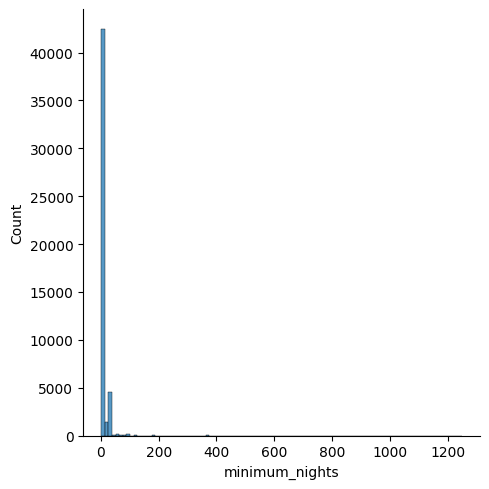

In [145]:
sns.displot(data.minimum_nights, bins=100)
plt.show()

Same issue as for price, which may be countered by a log10 transformation.

Text(0.5, 9.444444444444438, 'Minimum nights (log10)')

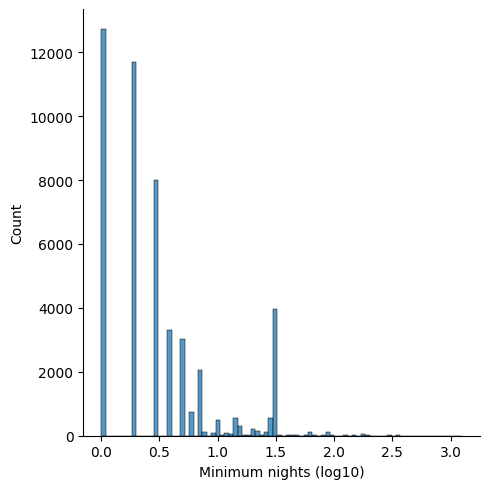

In [146]:
# distribution after log10 transformation

sns.displot(np.log10(data.minimum_nights))
plt.xlabel("Minimum nights (log10)")

Still resembling a right-skewed distribution. May need some thought further down the line.

### Number of reviews

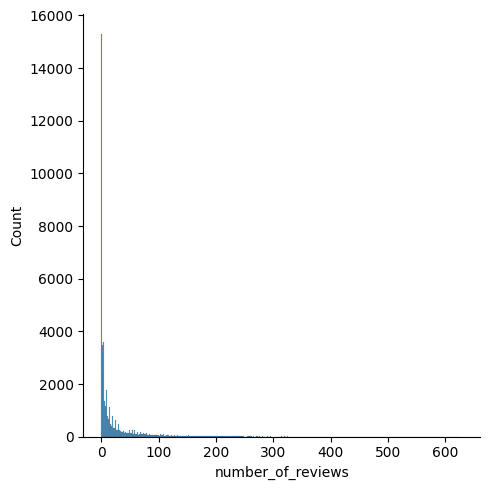

In [147]:
sns.displot(data.number_of_reviews)
plt.show()

Data heavily right-skewed as well.

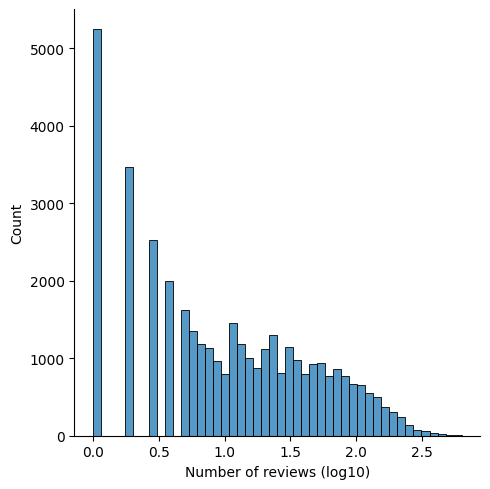

In [148]:
sns.displot(np.log10(data.number_of_reviews))
plt.xlabel("Number of reviews (log10)")
plt.show()

Similar pattern as for minimum nights (data not yet normal after log10 transformation)

### Reviews per month

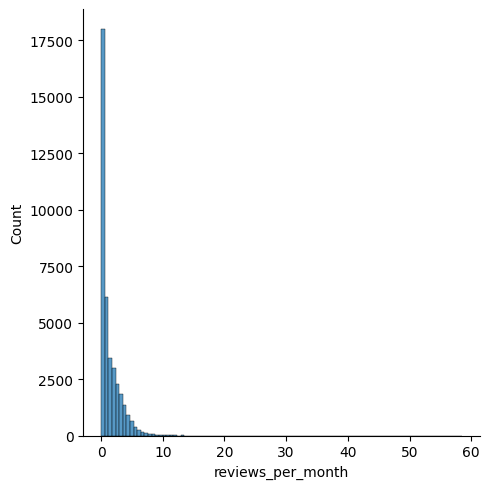

In [149]:
sns.displot(data.reviews_per_month, bins=100)
plt.show()

Same pattern as other variables

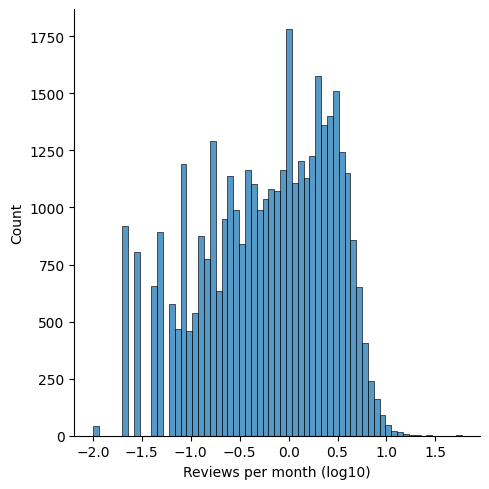

In [150]:
# histogram after log10 transformation

sns.displot(np.log10(data.reviews_per_month))
plt.xlabel("Reviews per month (log10)")
plt.show()

This transformations provides a reasonable log-normal distribution.

### Last review

The data do not contain info on listing date, only last review. Therefore it is difficult to extract any meaningful information from this variable as there is no indicator of "present time" for when the listing was posted. We will provide a general descriptive visualisation of this variable nevertheless.


In [151]:
data.last_review.info()

len(data.last_review)

<class 'pandas.core.series.Series'>
RangeIndex: 48895 entries, 0 to 48894
Series name: last_review
Non-Null Count  Dtype 
--------------  ----- 
38843 non-null  object
dtypes: object(1)
memory usage: 382.1+ KB


48895

In [152]:
# converting to datetime

data.last_review=pd.to_datetime(data.last_review, format="%Y-%m-%d")


In [153]:
# minimum and maximum values

print(data.last_review.min())

print(data.last_review.max())

2011-03-28 00:00:00
2019-07-08 00:00:00


In [154]:
# converting dates to months, calculating monthly counts

data['last_review_month']=data['last_review'].dt.strftime("%Y-%m")

df1=data.groupby('last_review_month').size().reset_index(name='count')

df1.last_review_month=pd.to_datetime(df1.last_review_month).dt.strftime('%Y-%b')

df1.sort_values('count',ascending=False)



,last_review_month,count
90,2019-Jun,12601
91,2019-Jul,4725
89,2019-May,3697
88,2019-Apr,1456
85,2019-Jan,1440
...,...,...
1,2011-Apr,1
11,2012-Oct,1
6,2012-May,1
2,2011-May,1


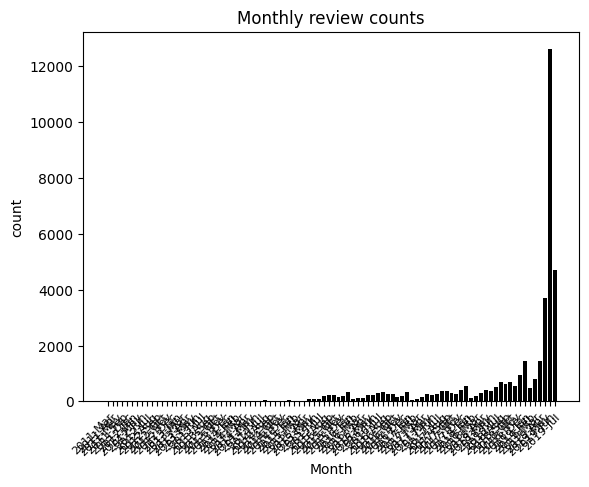

In [155]:
# plotting monthly counts


fig, ax = plt.subplots()
sns.barplot(x='last_review_month', y='count', data=df1, color="black")
ax.set(xlabel='Month', title="Monthly review counts")
ax.locator_params(axis="x",nbins=30)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor", size=8)

plt.show()

The last review for most listings is in June 2019. The most recent reviews are from July 2019, but this month has a smaller number of listings. The most recent "last review" was also identified as the 08th July 2019, indicating the data were probably collected on the 09th July 2019. We can therefore compute a new variable indicating time since last review.  
The data also shows a seasonal pattern for timing of last review for those listings which do not have a recent review (with most of such listings having a last review in summer months).

### Calculated host listing count


In [156]:
data.calculated_host_listings_count.describe()

count    48895.000000
mean         7.143982
std         32.952519
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max        327.000000
Name: calculated_host_listings_count, dtype: float64

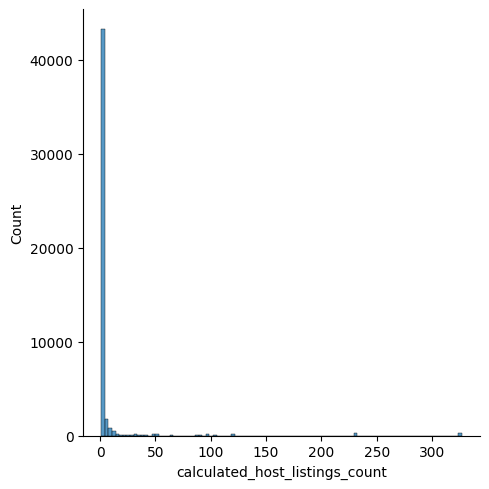

In [157]:
sns.displot(data.calculated_host_listings_count, bins=100)
plt.show()


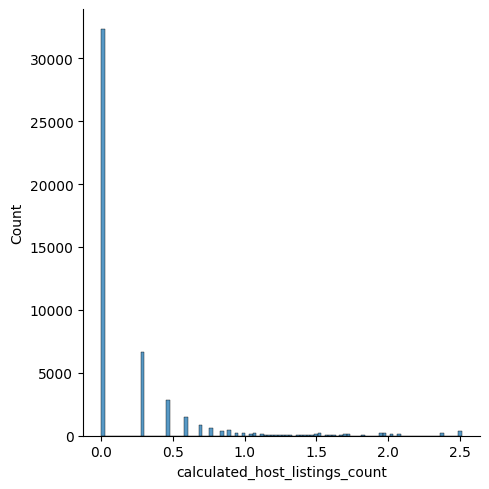

In [158]:
# distribution after log10 transformation

sns.displot(x=np.log10(data.calculated_host_listings_count), bins=100)

 Same issues with data transformations as previously

### Availability over 365 days


In [159]:
data.availability_365.describe()

count    48895.000000
mean       112.781327
std        131.622289
min          0.000000
25%          0.000000
50%         45.000000
75%        227.000000
max        365.000000
Name: availability_365, dtype: float64

In [160]:
print(f"A total of {data.availability_365[data['availability_365']==0].count()} listings as marked as having 0 days available for booking throughout the year (i.e. not available for booking).")

A total of 17533 listings as marked as having 0 days available for booking throughout the year (i.e. not available for booking).


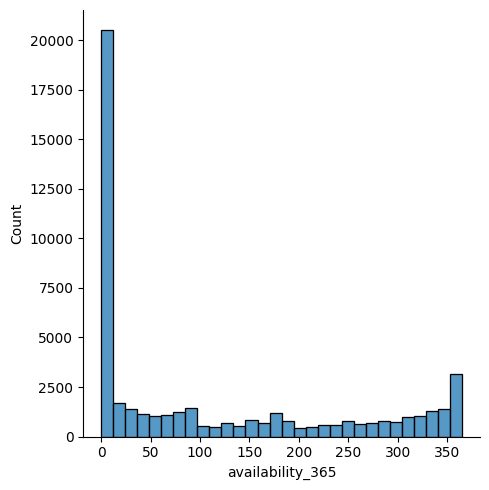

In [161]:
# histogram

sns.displot(data.availability_365)

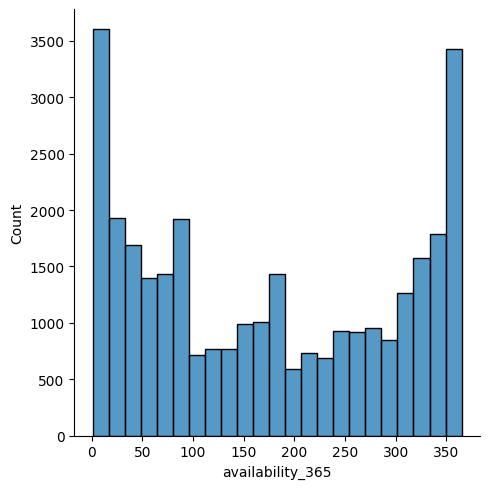

In [162]:
# histogram, after removing listings with 0 availability

sns.displot(data.availability_365[data.availability_365!=0])

## Bivariate data exploration (association between different variables)


### General correlations

                                   price  minimum_nights  number_of_reviews  \
price                           1.000000        0.042799          -0.047954   
minimum_nights                  0.042799        1.000000          -0.080116   
number_of_reviews              -0.047954       -0.080116           1.000000   
reviews_per_month              -0.030608       -0.121702           0.549868   
calculated_host_listings_count  0.057472        0.127960          -0.072376   
availability_365                0.081829        0.144303           0.172028   

                                reviews_per_month  \
price                                   -0.030608   
minimum_nights                          -0.121702   
number_of_reviews                        0.549868   
reviews_per_month                        1.000000   
calculated_host_listings_count          -0.009421   
availability_365                         0.185791   

                                calculated_host_listings_count  \
price   

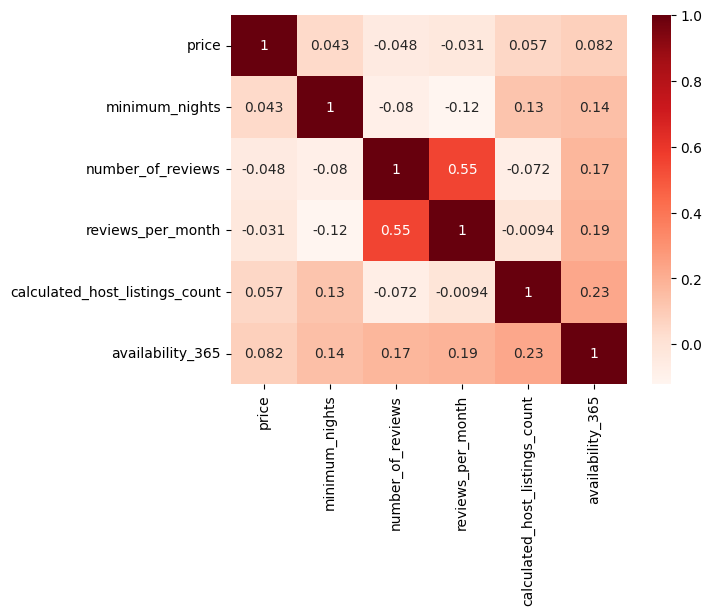

In [163]:
corrMatrix = data.select_dtypes(include=np.number).drop(['id', 'host_id', 'latitude', 'longitude'], axis=1).corr()

print(corrMatrix)

sns.heatmap(corrMatrix, annot = True, cmap= 'Reds')
plt.show()

<Axes: >

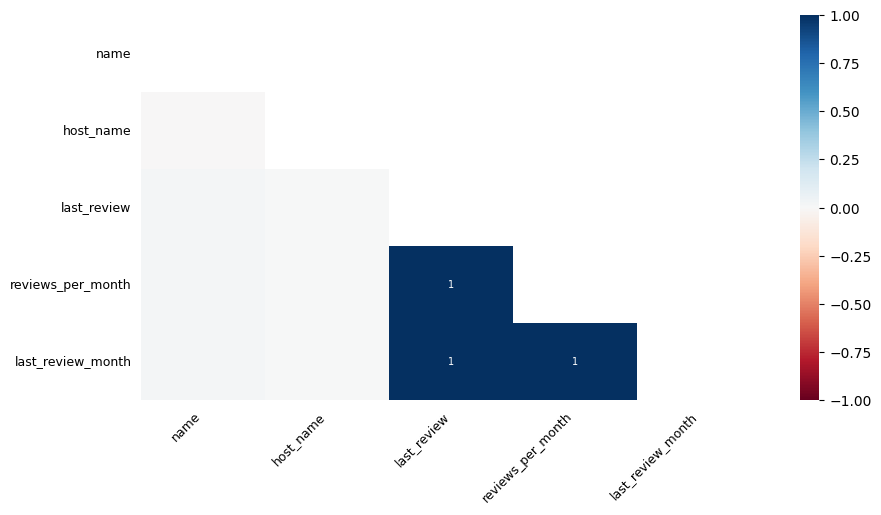

In [164]:
msno.heatmap(data, figsize=(10,5), fontsize=9)

<Axes: >

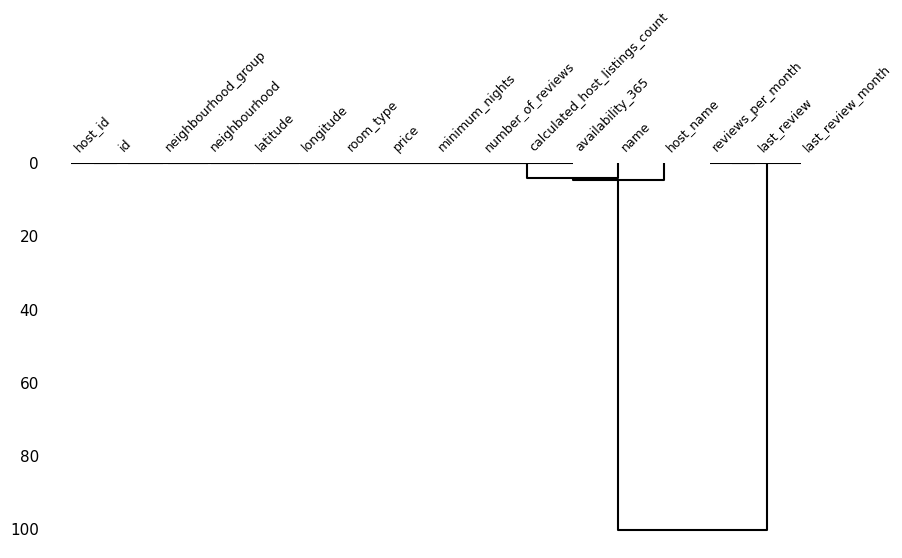

In [165]:
msno.dendrogram(data, figsize=(10,5), fontsize=9)

### Price vs host_id

Text(0.05, 0.8, "Pearson's r =0.02")

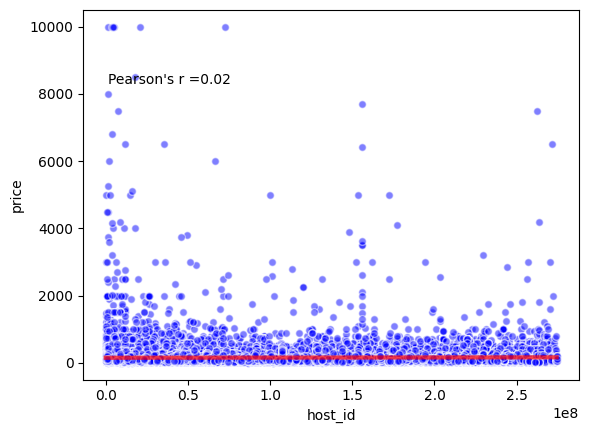

In [166]:

r, p = sp.stats.pearsonr(x=data.host_id, y=data.price)


ax = sns.regplot(data,
                x="host_id",
                y="price",
                scatter_kws=dict(alpha=0.5, s=30, color='blue', edgecolors='white'),
                 line_kws=dict(alpha=0.7, color='red', linewidth=3))
plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)

# plt.ylabel("Price")

# sns.scatterplot(data,
#                 x="host_id",
#                 y="price",
#                 scatter_kws={'alpha':0.3})




### Price vs neighbourhood_group

<Axes: xlabel='neighbourhood_group', ylabel='price'>

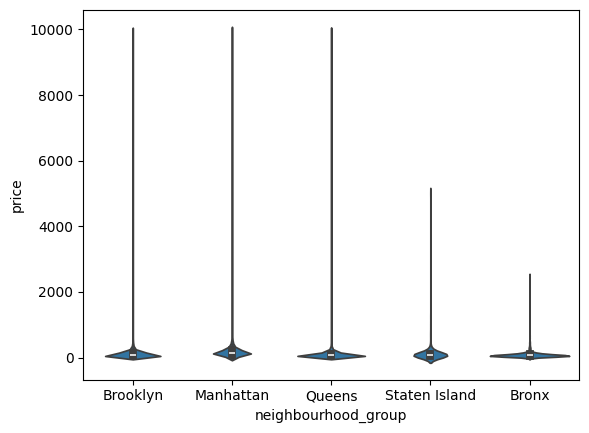

In [167]:
# All prices
sns.violinplot(data,
               x="neighbourhood_group",
               y="price")

<Axes: xlabel='neighbourhood_group', ylabel='price'>

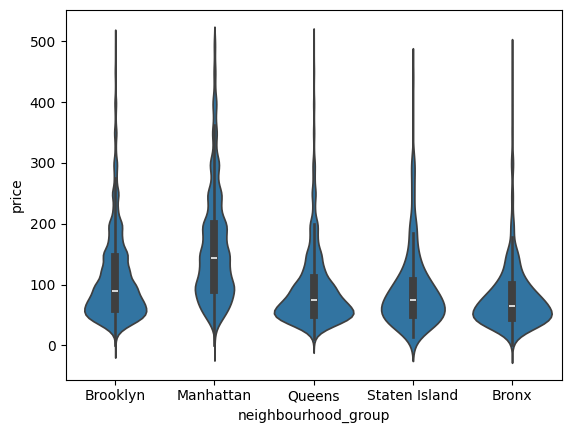

In [168]:
# Restricting to prices <500$
sns.violinplot(data.query("price<500"),
               x="neighbourhood_group",
               y="price")

### Price vs neighbourhood

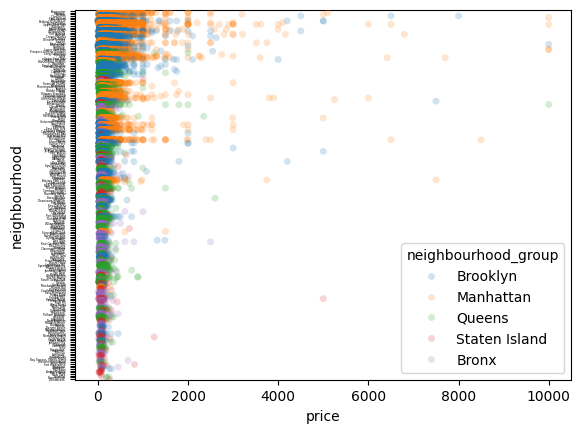

In [169]:
# possible visualisation; little discrimination as too many observations to plot

# price_order=data['price'].rank().sub(1).astype(int)


fig, ax = plt.subplots()

ax=sns.stripplot(data,
                 x="price",
                y="neighbourhood",
                hue="neighbourhood_group",
                alpha=0.2,
                # order=price_order.index,
                s=5)

plt.setp(ax.get_yticklabels(), ha="right", size=2)
plt.show()


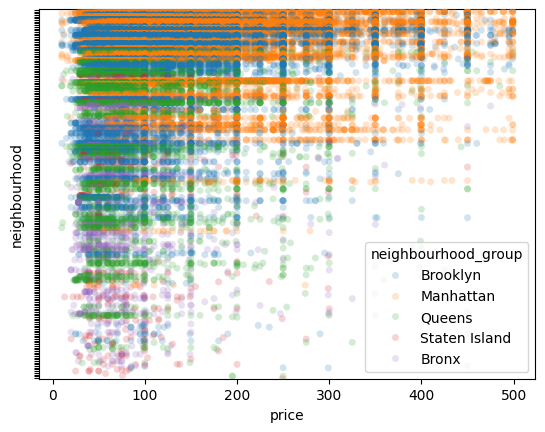

In [170]:
# possible visualisation; little discrimination as too many observations to plot
# repeating with prices<500 only



fig, ax = plt.subplots()

ax=sns.stripplot(data.query("price>0 & price <500"),
                 x="price",
                y="neighbourhood",
                hue="neighbourhood_group",
                alpha=0.2,
                # order=price_order.index,
                s=5)

ax.set(yticklabels=[])
plt.show()

### Price vs room type

<Axes: xlabel='room_type', ylabel='price'>

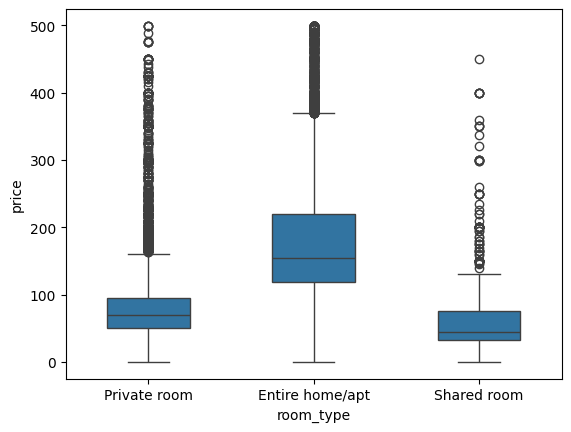

In [171]:
sns.boxplot(data.query("price<500"),
               x="room_type",
               y="price",
               width=0.5)

### Price vs minimum nights

Text(0.05, 0.8, "Pearson's r =0.04")

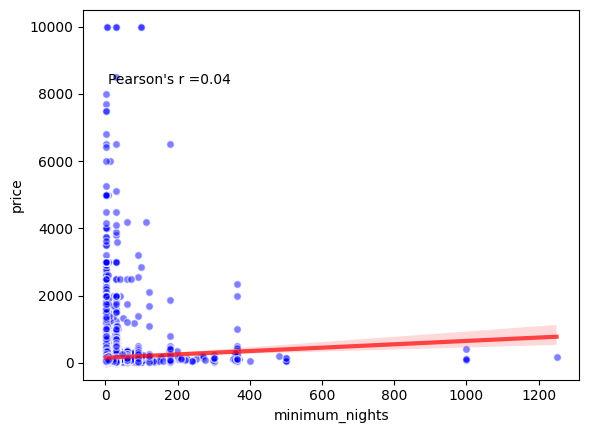

In [172]:

r, p = sp.stats.pearsonr(x=data.minimum_nights, y=data.price)

ax = sns.regplot(data,
            x="minimum_nights",
            y="price",
            scatter_kws=dict(alpha=0.5, s=30, color='blue', edgecolors='white'),
                 line_kws=dict(alpha=0.7, color='red', linewidth=3))

plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)

No evidence of a strong linear relationship

### Price vs number of reviews

Text(0.05, 0.8, "Pearson's r =-0.05")

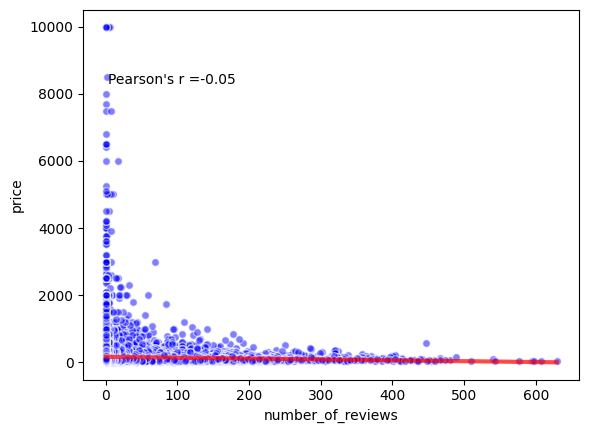

In [173]:

r, p = sp.stats.pearsonr(x=data.number_of_reviews, y=data.price)

ax = sns.regplot(data,
            x="number_of_reviews",
            y="price",
            scatter_kws=dict(alpha=0.5, s=30, color='blue', edgecolors='white'),
                 line_kws=dict(alpha=0.7, color='red', linewidth=3))


plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)


Possible inverse relationship, likely because listings with more reviews have more churn/shorter stays/are more accessible

### Price vs reviews per month

Text(0.05, 0.8, "Pearson's r =-0.03")

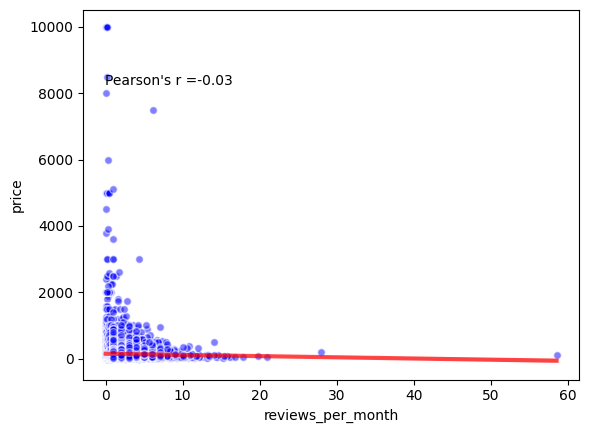

In [174]:
data_without_inf_nan = data.replace([np.inf, -np.inf], np.nan, inplace=False)
data_without_inf_nan = data_without_inf_nan.dropna(subset=['reviews_per_month', 'price'])

r, p = sp.stats.pearsonr(x=data_without_inf_nan.reviews_per_month, y=data_without_inf_nan.price)

sns.regplot(data_without_inf_nan,
            x='reviews_per_month',
            y="price",
            scatter_kws=dict(alpha=0.5, s=30, color='blue', edgecolors='white'),
                 line_kws=dict(alpha=0.7, color='red', linewidth=3))


plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)


Similar to total reviews

### Price vs availability

Text(0.05, 0.8, "Pearson's r =0.08")

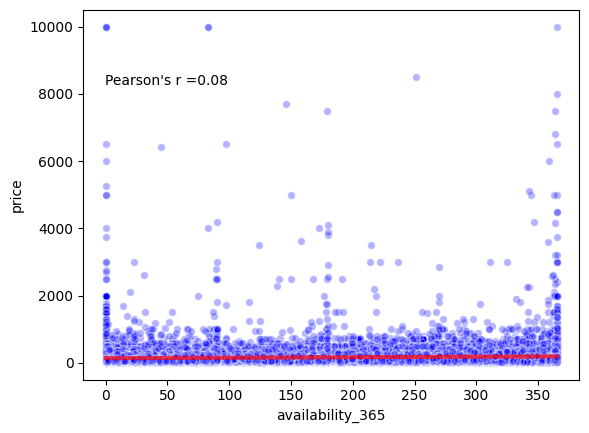

In [175]:

r, p = sp.stats.pearsonr(x=data.availability_365.dropna(), y=data.price[data.availability_365.notnull()])

sns.regplot(data,
            x='availability_365',
            y="price",
            scatter_kws=dict(alpha=0.3, s=30, color='blue', edgecolors='white'),
                 line_kws=dict(alpha=0.7, color='red', linewidth=3))


plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)



Weak positive correlation between these variables


### Price vs host listing count

Text(0.05, 0.8, "Pearson's r =0.06")

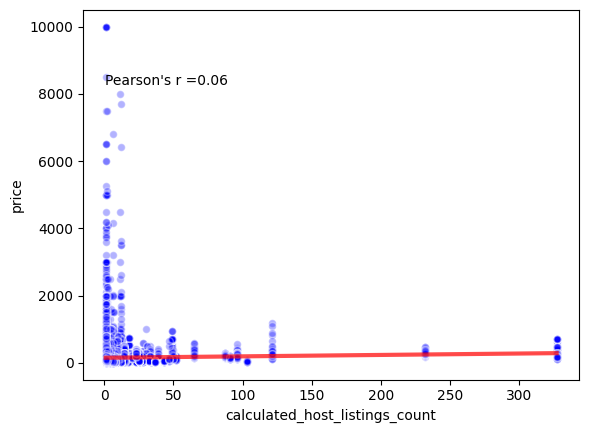

In [176]:

r, p = sp.stats.pearsonr(x=data.calculated_host_listings_count, y=data.price)

sns.regplot(data,
            x='calculated_host_listings_count',
            y="price",
            scatter_kws=dict(alpha=0.3, s=30, color='blue', edgecolors='white'),
                 line_kws=dict(alpha=0.7, color='red', linewidth=3))


plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)

### Number of reviews vs reviews per month


Text(0.05, 0.8, "Pearson's r =0.55")

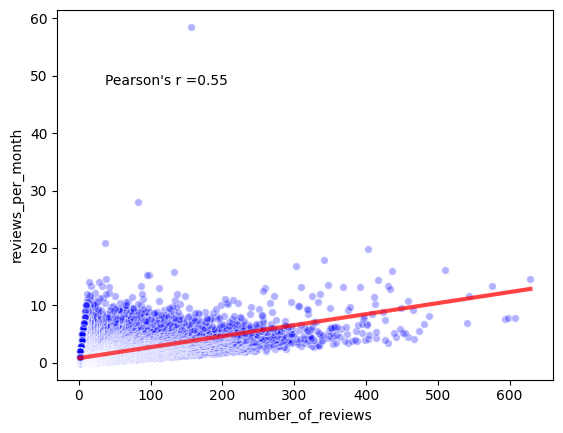

In [177]:
data_without_inf_nan = data.replace([np.inf, -np.inf], np.nan, inplace=False)
data_without_inf_nan = data_without_inf_nan.dropna(subset=['reviews_per_month', 'price'])
r, p = sp.stats.pearsonr(x=data_without_inf_nan.number_of_reviews, y=data_without_inf_nan.reviews_per_month)

sns.regplot(data_without_inf_nan,
            x='number_of_reviews',
            y="reviews_per_month",
            scatter_kws=dict(alpha=0.3, s=30, color='blue', edgecolors='white'),
                 line_kws=dict(alpha=0.7, color='red', linewidth=3))

plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)

Evidence of moderate correlation, but still within reasonable limits to include in regression model

## Multivariate data exploration (price vs multiple variables)

### Prive vs neighbourhood group + room_type

In [178]:
grp_mean = data.groupby(['neighbourhood_group'])['price'].mean()
grp_sum = data.groupby('neighbourhood_group')['price'].sum()

list=[]
for key, value in grp_mean.items():
    list.append([key,value, grp_sum[key]])
df = pd.DataFrame(list, columns=['neighbourhood_group', 'avg', 'sum'])
df


,neighbourhood_group,avg,sum
0,Bronx,87.496792,95459
1,Brooklyn,124.383207,2500600
2,Manhattan,196.875814,4264527
3,Queens,99.517649,563867
4,Staten Island,114.812332,42825


In [179]:
### Sum price per neighbourhood group and room type

grp_sum = data.groupby(['neighbourhood_group', 'room_type'])['price'].sum()
df = pd.DataFrame([grp_sum])
df

neighbourhood_group           Bronx                                 Brooklyn  \
room_type           Entire home/apt Private room Shared room Entire home/apt   
price                         48325        43546        3588         1704633   

neighbourhood_group                                Manhattan               \
room_type           Private room Shared room Entire home/apt Private room   
price                     775099       20868         3289707       932111   

neighbourhood_group                      Queens                           \
room_type           Shared room Entire home/apt Private room Shared room   
price                     42709          308218       241983       13666   

neighbourhood_group   Staten Island                           
room_type           Entire home/apt Private room Shared room  
price                         30597        11711         517

In [180]:
### Average price per neighbourhood group and room type

grp_mean = data.groupby(['neighbourhood_group', 'room_type'])['price'].mean()
df = pd.DataFrame([grp_mean])
df

neighbourhood_group           Bronx                                 Brooklyn  \
room_type           Entire home/apt Private room Shared room Entire home/apt   
price                    127.506596    66.788344        59.8      178.327545   

neighbourhood_group                                Manhattan               \
room_type           Private room Shared room Entire home/apt Private room   
price                  76.500099   50.527845      249.239109   116.776622   

neighbourhood_group                      Queens                           \
room_type           Shared room Entire home/apt Private room Shared room   
price                 88.977083      147.050573    71.762456   69.020202   

neighbourhood_group   Staten Island                           
room_type           Entire home/apt Private room Shared room  
price                    173.846591    62.292553   57.444444

In [181]:
data.dtypes

id                                         int64
name                                      object
host_id                                    int64
host_name                                 object
neighbourhood_group                       object
neighbourhood                             object
latitude                                 float64
longitude                                float64
room_type                                 object
price                                      int64
minimum_nights                             int64
number_of_reviews                          int64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
last_review_month                         object
dtype: object

# Feature engineering / data processing

## Handling missing values

In [182]:
# imputing 0 for reviews_per_month; others will be left as missing

data.fillna({'reviews_per_month':0}, inplace=True)

## Derived variables

### Time since last review

In [183]:
# adding variable to dataset

# current_date = date.today()
# counter = 0
# for dt in data['last_review']:
#     if not pd.isnull(dt) and counter<20:
#         dt_obj=datetime.strptime(dt, '%Y-%m-%d').date()
#         delta = current_date - dt_obj
#         print(f"Time since last review: {delta.days} days")
#         counter+=1

extract_date = pd.to_datetime("2019-07-09", format="%Y-%m-%d").date()
print(f"Likely data extract date is {extract_date}")

data['days_since_last_review']=(pd.to_datetime(extract_date) - pd.to_datetime(data['last_review'], format="%Y-%m-%d", errors='coerce')) / np.timedelta64(1, 'D')



Likely data extract date is 2019-07-09


count    38843.000000
mean       277.925418
std        413.916984
min          1.000000
25%         16.000000
50%         51.000000
75%        366.000000
max       3025.000000
Name: days_since_last_review, dtype: float64


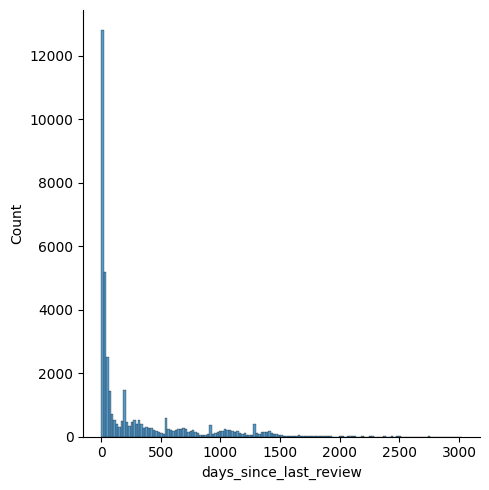

In [184]:
 # exploring new variable

print(data.days_since_last_review.describe())

sns.displot(data.days_since_last_review)


Poisson-like distribution given variable represents "time since event"

Text(0.05, 0.8, "Pearson's r =0.02")

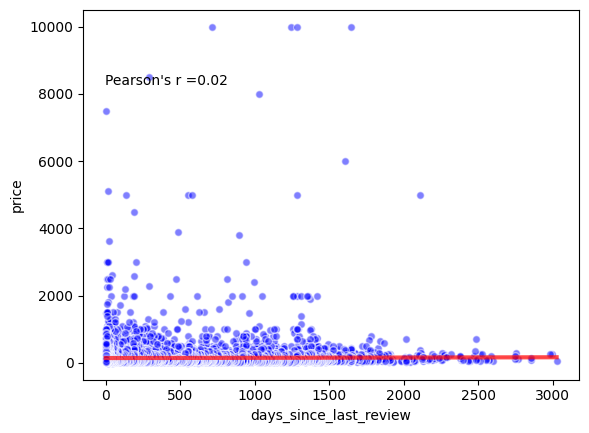

In [185]:
# exploring relation with price


r, p = sp.stats.pearsonr(x=data.days_since_last_review.dropna(), y=data.price[data.days_since_last_review.notnull()])

sns.regplot(data,
            x="days_since_last_review",
            y="price",
            scatter_kws=dict(alpha=0.5, s=30, color='blue', edgecolors='white'),
                 line_kws=dict(alpha=0.7, color='red', linewidth=3))


plt.text(.05, .8, "Pearson's r ={:.2f}".format(r), transform=ax.transAxes)

Strength of association seems quite weak. Need to assess if worth adding to the model

### Availability (binary)

<Axes: xlabel='available_binary', ylabel='price'>

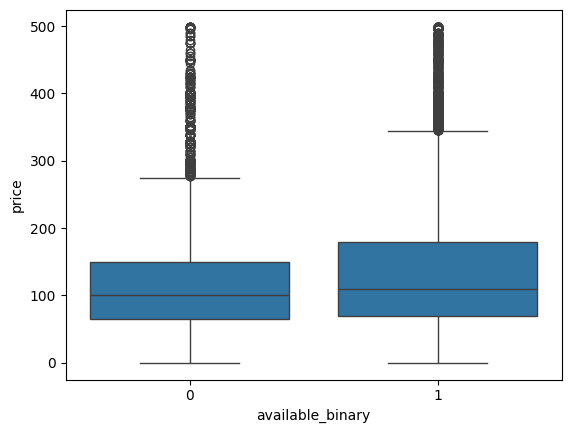

In [186]:
data['available_binary']=np.where(data['availability_365']>0, 1, 0)

sns.boxplot(data[data.price<500],
            x="available_binary",
            y="price")


No evidence of important association between availability (binary) and price; median seems to be slightly higher for listings marked as available though.

## Handling outliers

The procedure here will be to explore distributions, assess for normality, and manually verify data for outliers in each variable.

Several approaches to handling outliers are possible:
- removing
- Winsorising (i.e. replacing outlier variables below the 5th percentile with the 5th percentile for example, and above the 95th percentile with the 95th percentile)

### Price

Review general distributions:

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

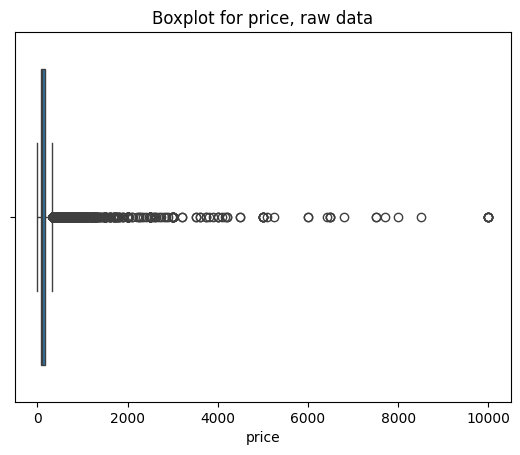

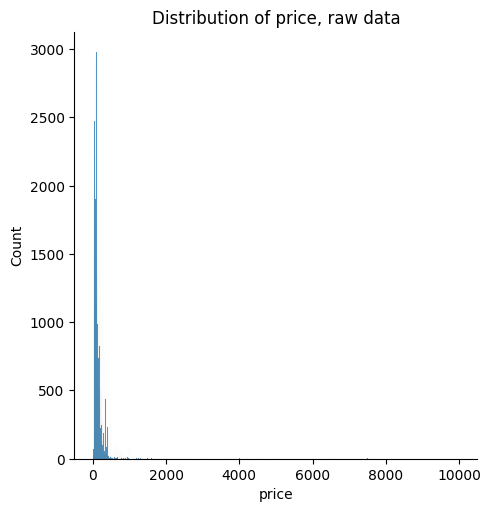

In [187]:
sns.boxplot(data,
            x="price")
# sns.stripplot(data, x="price",alpha=0.2, color="black")
plt.title("Boxplot for price, raw data")

sns.displot(data.price)
plt.title("Distribution of price, raw data")


data.price.describe()

Check a handful of outliers at each extreme.

In [188]:
data.nsmallest(9, "price", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

,name,neighbourhood_group,room_type,price,minimum_nights,number_of_reviews,availability_365
23161,"Huge Brooklyn Brownstone Living, Close to it all.",Brooklyn,Private room,0,4,1,28
25433,★Hostel Style Room | Ideal Traveling Buddies★,Bronx,Private room,0,2,55,127
25634,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",Brooklyn,Private room,0,2,16,0
25753,"Sunny, Quiet Room in Greenpoint",Brooklyn,Private room,0,2,12,0
25778,Modern apartment in the heart of Williamsburg,Brooklyn,Entire home/apt,0,5,3,73
25794,Spacious comfortable master bedroom with nice ...,Brooklyn,Private room,0,1,93,176
25795,Contemporary bedroom in brownstone with nice view,Brooklyn,Private room,0,1,95,232
25796,Cozy yet spacious private brownstone bedroom,Brooklyn,Private room,0,1,95,222
26259,the best you can find,Manhattan,Entire home/apt,0,3,0,0
26841,Coliving in Brooklyn! Modern design / Shared room,Brooklyn,Shared room,0,30,2,333


Listings with price 0 are unlikely to be informative, we should drop these.

In [189]:
# dropping 0 price

data=data[data.price>0]

Checking lowest values after removing 0 price

In [190]:
data.nsmallest(9, "price", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

,name,neighbourhood_group,room_type,price,minimum_nights,number_of_reviews,availability_365
2860,Large furnished 2 bedrooms- - 30 days Minimum,Manhattan,Entire home/apt,10,30,0,137
21700,Couch in Harlem Harvey Refugees only,Manhattan,Shared room,10,1,0,0
22261,"Newly renovated, fully furnished room in Brooklyn",Brooklyn,Private room,10,5,0,0
22287,Jen Apt,Manhattan,Private room,10,5,2,0
22835,IT'S SIMPLY CONVENIENT!,Queens,Entire home/apt,10,1,43,252
23256,"Quiet, Cozy UES Studio Near the Subway",Manhattan,Entire home/apt,10,3,10,0
24100,"Girls only, cozy room one block from Times Square",Manhattan,Shared room,10,1,2,0
27972,Spacious 2-bedroom Apt in Heart of Greenpoint,Brooklyn,Entire home/apt,10,1,93,32
31066,"Very Spacious bedroom, steps from CENTRAL PARK.",Manhattan,Private room,10,1,2,0
31407,Cozy feel at home studio,Manhattan,Private room,10,5,42,2


Many of these are private or shared rooms, rather than entire homes or appartements. There are also some of the latter, for which the price seems to be too low.

Now checking highest price values:

In [191]:
data.nlargest(9, "price", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

,name,neighbourhood_group,room_type,price,minimum_nights,number_of_reviews,availability_365
9151,Furnished room in Astoria apartment,Queens,Private room,10000,100,2,0
17692,Luxury 1 bedroom apt. -stunning Manhattan views,Brooklyn,Entire home/apt,10000,5,5,0
29238,1-BR Lincoln Center,Manhattan,Entire home/apt,10000,30,0,83
6530,Spanish Harlem Apt,Manhattan,Entire home/apt,9999,5,1,0
12342,"Quiet, Clean, Lit @ LES & Chinatown",Manhattan,Private room,9999,99,6,83
40433,2br - The Heart of NYC: Manhattans Lower East ...,Manhattan,Entire home/apt,9999,30,0,365
30268,Beautiful/Spacious 1 bed luxury flat-TriBeCa/Soho,Manhattan,Entire home/apt,8500,30,2,251
4377,Film Location,Brooklyn,Entire home/apt,8000,1,1,365
29662,East 72nd Townhouse by (Hidden by Airbnb),Manhattan,Entire home/apt,7703,1,0,146


Check outliers using interquartile range approach (see [reference](https://doi.org/10.1016/j.dajour.2023.100164)).

In [192]:
# check outliers (using IQR approach)

def find_outliers_IQR(df):
   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))].notnull()

   print(f"Outlier lower cut-off = {q1-1.5*IQR if q1-1.5*IQR>0 else 0}")

   print(f"Outlier upper cut-off = {q3+1.5*IQR}")

   return outliers


data['price_outliers_iqr']=find_outliers_IQR(data.price)

data[data.price_outliers_iqr.notnull()][['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

print(f"Total number of outliers using this approach is {len(data[data.price_outliers_iqr.notnull()])} ({len(data[data.price_outliers_iqr.notnull()])/len(data)*100:.2f}%)")


Outlier lower cut-off = 0
Outlier upper cut-off = 334.0
Total number of outliers using this approach is 2972 (6.08%)


Now checking outliers using distribution percentiles

In [193]:
# create function

def find_outliers_percentile(df,p1,p2):
   low=df.quantile(p1)

   high=df.quantile(p2)

   outliers = df[((df<low) | (df>high))].notnull()

   print(f"Outlier lower cut-off = {low}")

   print(f"Outlier upper cut-off = {high}")

   return outliers

# check outliers (using 5/95 percentile)

print("5/95 percentile approach:")
data['price_outliers_5_95']=find_outliers_percentile(data.price,0.05,0.95)

data[data.price_outliers_5_95.notnull()][['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

print(f"Total number of outliers is {len(data[data.price_outliers_5_95.notnull()])} ({len(data[data.price_outliers_5_95.notnull()])/len(data)*100:.2f}%)")

# check outliers (using 1/99 percentile)

print("\n1/99 percentile approach:")

data['price_outliers_1_99']=find_outliers_percentile(data.price,0.01,0.99)

data[data.price_outliers_1_99.notnull()][['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

print(f"Total number of outliers is {len(data[data.price_outliers_1_99.notnull()])} ({len(data[data.price_outliers_1_99.notnull()])/len(data)*100:.2f}%)")



5/95 percentile approach:
Outlier lower cut-off = 40.0
Outlier upper cut-off = 355.0
Total number of outliers is 4472 (9.15%)

1/99 percentile approach:
Outlier lower cut-off = 30.0
Outlier upper cut-off = 799.0
Total number of outliers is 867 (1.77%)


Text(0.5, 1.0, 'Distribution of price, with outliers removed (1/99 percentile method)')

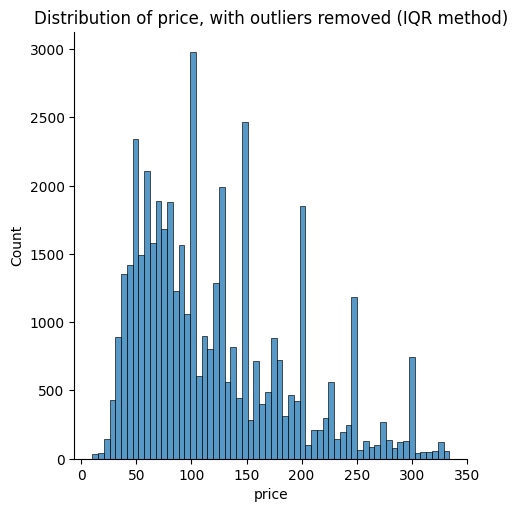

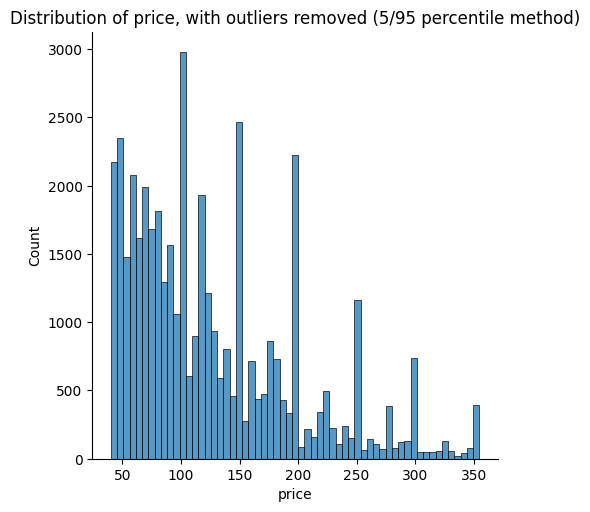

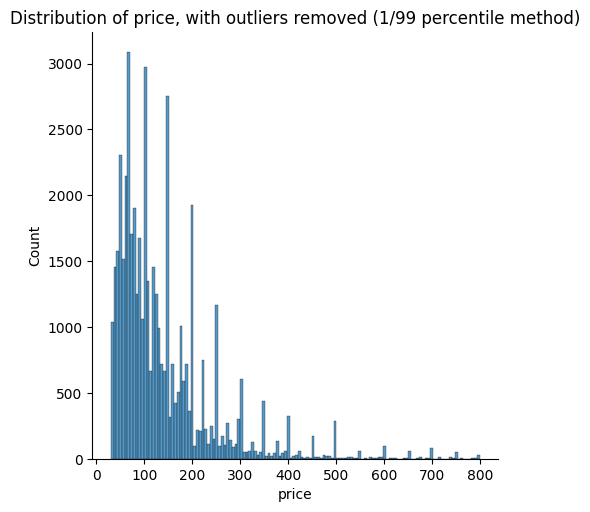

In [194]:
sns.displot(data[data.price_outliers_iqr.isnull()].price)
plt.title("Distribution of price, with outliers removed (IQR method)")


sns.displot(data[data.price_outliers_5_95.isnull()].price)
plt.title("Distribution of price, with outliers removed (5/95 percentile method)")

sns.displot(data[data.price_outliers_1_99.isnull()].price)
plt.title("Distribution of price, with outliers removed (1/99 percentile method)")

IQR method seems to provide a distribution which is closer to normal. It is also a mid-way point between the amount of data removed by either percentile approaches, so seems like a reasonable option, but either can be used.

We also need to chose whether to trim (i.e. delete observation) or to replace values with more suitable ones (i.e. Winsorising). As per [this reference](https://stats.stackexchange.com/questions/22711/is-it-allowed-to-use-a-5-trimmed-mean-for-analyzing-data-from-a-creativity-task/22724#22724), we can consider trimming if we think that observations are likely to be entirely wrong, or belong to a fundamentally different distribution, or else Winsorising if we think that they do belong in the distribution, but we would like it to be slightly more even.  

An argument could be made for either, but we might favour Winsorising in this case.

In [195]:
# TEST FOR NORMALITY (code not needed for the moment, saving here)

# t, p = st.kstest(data.price, "norm")

# print("Kolmogorov-Smirnov test for price, as provided, W:", t, "\n", "p-value:", p)
# # raw data are not normally distributed, as expected

# # transform to log10

# t, p = st.kstest(np.log10(data.price), "norm")

# print("Kolmogorov-Smirnov test for price, log10-transformed, W:", t, "\n", "p-value:", p)
# not normally distributed either

### Minimum nights

Review general distributions:

count    48884.000000
mean         7.029887
std         20.512224
min          1.000000
25%          1.000000
50%          3.000000
75%          5.000000
max       1250.000000
Name: minimum_nights, dtype: float64

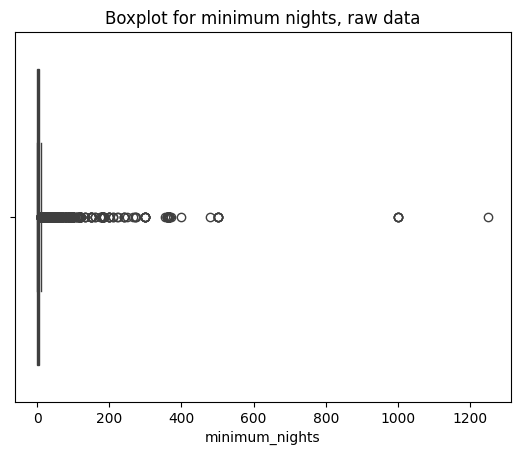

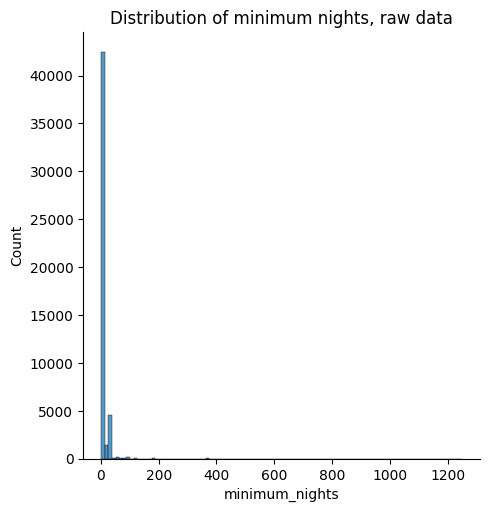

In [196]:
sns.boxplot(data,
            x="minimum_nights")
# sns.stripplot(data, x="price",alpha=0.2, color="black")
plt.title("Boxplot for minimum nights, raw data")

sns.displot(data.minimum_nights, bins=100)
plt.title("Distribution of minimum nights, raw data")


data.minimum_nights.describe()

Data is also highly skewed. Let's check some possible outliers

In [197]:
data.nsmallest(9, "minimum_nights", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

,name,neighbourhood_group,room_type,price,minimum_nights,number_of_reviews,availability_365
0,Clean & quiet apt home by the park,Brooklyn,Private room,149,1,9,365
1,Skylit Midtown Castle,Manhattan,Entire home/apt,225,1,45,355
3,Cozy Entire Floor of Brownstone,Brooklyn,Entire home/apt,89,1,270,194
9,Cute & Cozy Lower East Side 1 bdrm,Manhattan,Entire home/apt,150,1,160,188
17,Chelsea Perfect,Manhattan,Private room,140,1,260,12
...,...,...,...,...,...,...,...
48878,Room for rest,Queens,Private room,45,1,0,172
48880,The Raccoon Artist Studio in Williamsburg New ...,Brooklyn,Entire home/apt,120,1,0,365
48887,Garden Jewel Apartment in Williamsburg New York,Brooklyn,Entire home/apt,170,1,0,365
48889,QUIT PRIVATE HOUSE,Queens,Private room,65,1,0,163


Minimum nights of 1 seems like a reasonable value for this variable. Let's scheck maximum values

In [198]:
data.nlargest(9, "minimum_nights", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

,name,neighbourhood_group,room_type,price,minimum_nights,number_of_reviews,availability_365
5767,Prime W. Village location 1 bdrm,Manhattan,Entire home/apt,180,1250,2,365
2854,NaN,Manhattan,Entire home/apt,400,1000,0,362
13404,Historic Designer 2 Bed. Apartment,Manhattan,Entire home/apt,99,999,2,42
26341,Beautiful place in Brooklyn! #2,Brooklyn,Private room,79,999,24,249
38664,Shared Studio (females only),Manhattan,Shared room,110,999,0,365
7355,Beautiful Fully Furnished 1 bed/bth,Queens,Entire home/apt,134,500,30,90
8014,Wonderful Large 1 bedroom,Manhattan,Entire home/apt,75,500,0,362
11193,Zen Room in Crown Heights Brooklyn,Brooklyn,Private room,50,500,10,365
14285,Peaceful apartment close to F/G,Brooklyn,Private room,45,500,0,358
47620,Williamsburg Apartment,Brooklyn,Entire home/apt,140,500,0,331


Minimum stays over a year seem unlikely. We'll remove some possible outliers here.

Check outliers using interquartile range approach (see [reference](https://doi.org/10.1016/j.dajour.2023.100164)).

In [199]:
# check outliers (using IQR approach)

data['minimum_nights_outliers_iqr']=find_outliers_IQR(data.minimum_nights)

data[data.minimum_nights_outliers_iqr.notnull()][['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

print(f"Total number of outliers using this approach is {len(data[data.minimum_nights_outliers_iqr.notnull()])} ({len(data[data.minimum_nights_outliers_iqr.notnull()])/len(data)*100:.2f}%)")


Outlier lower cut-off = 0
Outlier upper cut-off = 11.0
Total number of outliers using this approach is 6605 (13.51%)


Now checking outliers using distribution percentiles

In [200]:
# check outliers (using 5/95 percentile)

print("5/95 percentile approach:")
data['minimum_nights_outliers_5_95']=find_outliers_percentile(data.minimum_nights,0.05,0.95)

data[data.minimum_nights_outliers_5_95.notnull()][['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

print(f"Total number of outliers is {len(data[data.minimum_nights_outliers_5_95.notnull()])} ({len(data[data.minimum_nights_outliers_5_95.notnull()])/len(data)*100:.2f}%)")

# check outliers (using 1/99 percentile)

print("\n1/99 percentile approach:")

data['minimum_nights_outliers_1_99']=find_outliers_percentile(data.minimum_nights,0.01,0.99)

data[data.minimum_nights_outliers_1_99.notnull()][['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

print(f"Total number of outliers is {len(data[data.minimum_nights_outliers_1_99.notnull()])} ({len(data[data.minimum_nights_outliers_1_99.notnull()])/len(data)*100:.2f}%)")



5/95 percentile approach:
Outlier lower cut-off = 1.0
Outlier upper cut-off = 30.0
Total number of outliers is 747 (1.53%)

1/99 percentile approach:
Outlier lower cut-off = 1.0
Outlier upper cut-off = 45.0
Total number of outliers is 469 (0.96%)


Visualising data after transformations:

Text(0.5, 1.0, 'Distribution of minimum nights, with outliers removed (1/99 percentile method)')

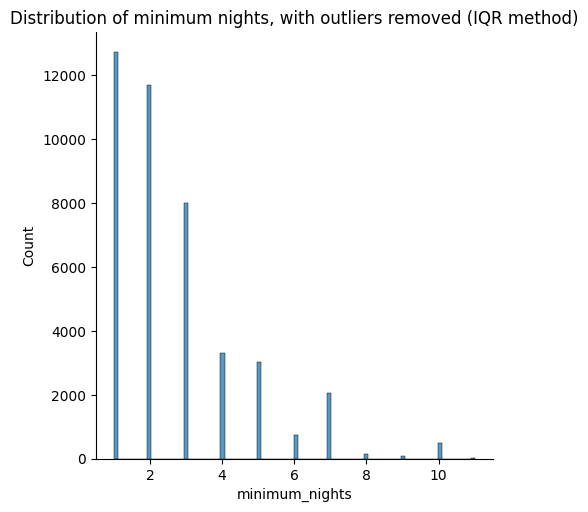

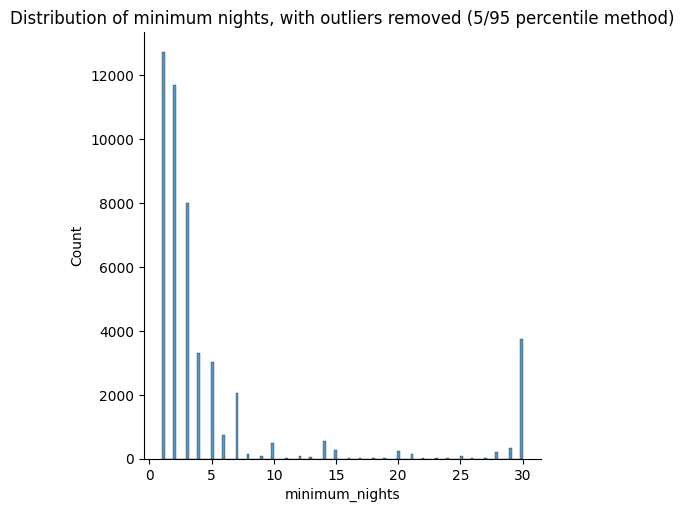

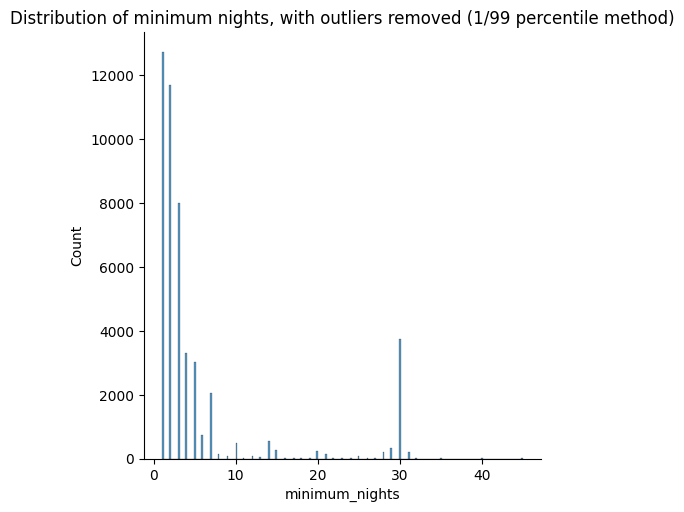

In [201]:
sns.displot(data[data.minimum_nights_outliers_iqr.isnull()].minimum_nights)
plt.title("Distribution of minimum nights, with outliers removed (IQR method)")


sns.displot(data[data.minimum_nights_outliers_5_95.isnull()].minimum_nights)
plt.title("Distribution of minimum nights, with outliers removed (5/95 percentile method)")

sns.displot(data[data.minimum_nights_outliers_1_99.isnull()].minimum_nights)
plt.title("Distribution of minimum nights, with outliers removed (1/99 percentile method)")

IQR method seems very restrictive in this setting. Both percentile approaches seem to retain a large number of observations of "30", which would seem reasonable.

### Number of reviews

Review general distributions:

count    48884.000000
mean        23.271991
std         44.551331
min          0.000000
25%          1.000000
50%          5.000000
75%         24.000000
max        629.000000
Name: number_of_reviews, dtype: float64

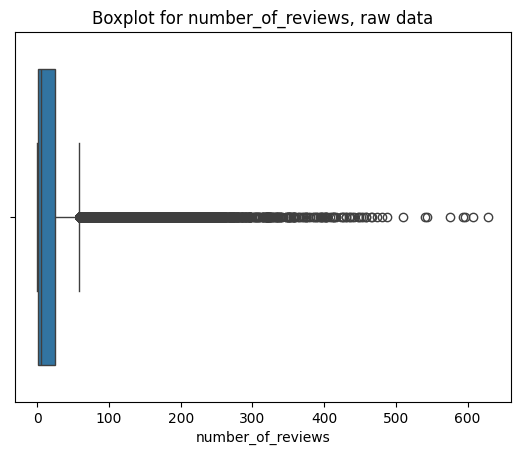

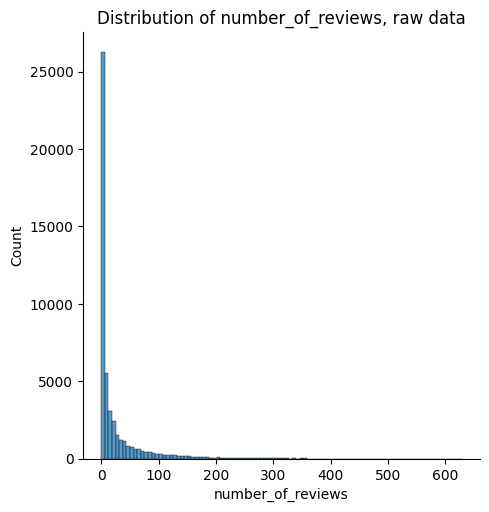

In [202]:
sns.boxplot(data,
            x="number_of_reviews")
# sns.stripplot(data, x="price",alpha=0.2, color="black")
plt.title("Boxplot for number_of_reviews, raw data")

sns.displot(data.number_of_reviews, bins=100)
plt.title("Distribution of number_of_reviews, raw data")


data.number_of_reviews.describe()

Data is also highly skewed. Let's check some possible outliers

In [203]:
data.nsmallest(9, "number_of_reviews", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

,name,neighbourhood_group,room_type,price,minimum_nights,number_of_reviews,availability_365
2,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Private room,150,3,0,365
19,Huge 2 BR Upper East Cental Park,Manhattan,Entire home/apt,190,7,0,249
26,Magnifique Suite au N de Manhattan - vue Cloitres,Manhattan,Private room,80,4,0,0
36,Clean and Quiet in Brooklyn,Brooklyn,Private room,35,60,0,365
38,Country space in the city,Brooklyn,Private room,150,1,0,365
...,...,...,...,...,...,...,...
48890,Charming one bedroom - newly renovated rowhouse,Brooklyn,Private room,70,2,0,9
48891,Affordable room in Bushwick/East Williamsburg,Brooklyn,Private room,40,4,0,36
48892,Sunny Studio at Historical Neighborhood,Manhattan,Entire home/apt,115,10,0,27
48893,43rd St. Time Square-cozy single bed,Manhattan,Shared room,55,1,0,2


Minimum nights of 0 seems like a reasonable value for this variable. Let's check maximum values

In [204]:
data.nlargest(9, "number_of_reviews", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

,name,neighbourhood_group,room_type,price,minimum_nights,number_of_reviews,availability_365
11759,Room near JFK Queen Bed,Queens,Private room,47,1,629,333
2031,Great Bedroom in Manhattan,Manhattan,Private room,49,1,607,293
2030,Beautiful Bedroom in Manhattan,Manhattan,Private room,49,1,597,342
2015,Private Bedroom in Manhattan,Manhattan,Private room,49,1,594,339
13495,Room Near JFK Twin Beds,Queens,Private room,47,1,576,173
10623,Steps away from Laguardia airport,Queens,Private room,46,1,543,163
1879,Manhattan Lux Loft.Like.Love.Lots.Look !,Manhattan,Private room,99,2,540,179
20403,Cozy Room Family Home LGA Airport NO CLEANING FEE,Queens,Private room,48,1,510,341
4870,Private brownstone studio Brooklyn,Brooklyn,Entire home/apt,160,1,488,269


Top values for maximum reviews also seem reasonable. We could just keep these as they are, but we could benefit from having a more even distribution. Let's explore some possible approaches.

Check outliers using interquartile range approach (see [reference](https://doi.org/10.1016/j.dajour.2023.100164)).

In [205]:
# check outliers (using IQR approach)

data['number_of_reviews_outliers_iqr']=find_outliers_IQR(data.number_of_reviews)

data[data.number_of_reviews_outliers_iqr.notnull()][['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

print(f"Total number of outliers using this approach is {len(data[data.number_of_reviews_outliers_iqr.notnull()])} ({len(data[data.number_of_reviews_outliers_iqr.notnull()])/len(data)*100:.2f}%)")


Outlier lower cut-off = 0
Outlier upper cut-off = 58.5
Total number of outliers using this approach is 6018 (12.31%)


Now checking outliers using distribution percentiles

In [206]:
# check outliers (using 5/95 percentile)

print("5/95 percentile approach:")
data['number_of_reviews_outliers_5_95']=find_outliers_percentile(data.number_of_reviews,0.05,0.95)

data[data.number_of_reviews_outliers_5_95.notnull()][['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

print(f"Total number of outliers is {len(data[data.number_of_reviews_outliers_5_95.notnull()])} ({len(data[data.number_of_reviews_outliers_5_95.notnull()])/len(data)*100:.2f}%)")

# check outliers (using 1/99 percentile)

print("\n1/99 percentile approach:")

data['number_of_reviews_outliers_1_99']=find_outliers_percentile(data.number_of_reviews,0.01,0.99)

data[data.number_of_reviews_outliers_1_99.notnull()][['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365']]

print(f"Total number of outliers is {len(data[data.number_of_reviews_outliers_1_99.notnull()])} ({len(data[data.number_of_reviews_outliers_1_99.notnull()])/len(data)*100:.2f}%)")



5/95 percentile approach:
Outlier lower cut-off = 0.0
Outlier upper cut-off = 114.0
Total number of outliers is 2430 (4.97%)

1/99 percentile approach:
Outlier lower cut-off = 0.0
Outlier upper cut-off = 214.0
Total number of outliers is 480 (0.98%)


Visualising data after transformations:

Text(0.5, 1.0, 'Distribution of number_of_reviews, with outliers removed (1/99 percentile method)')

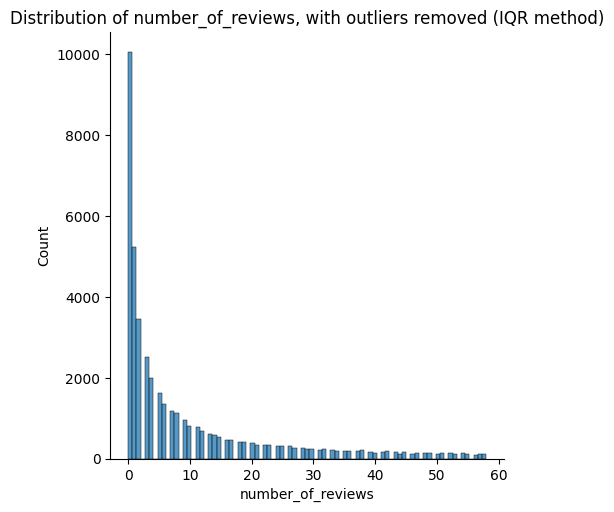

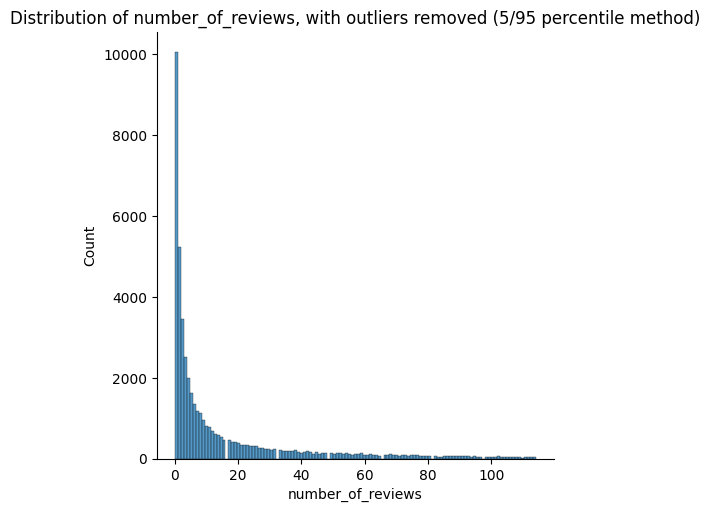

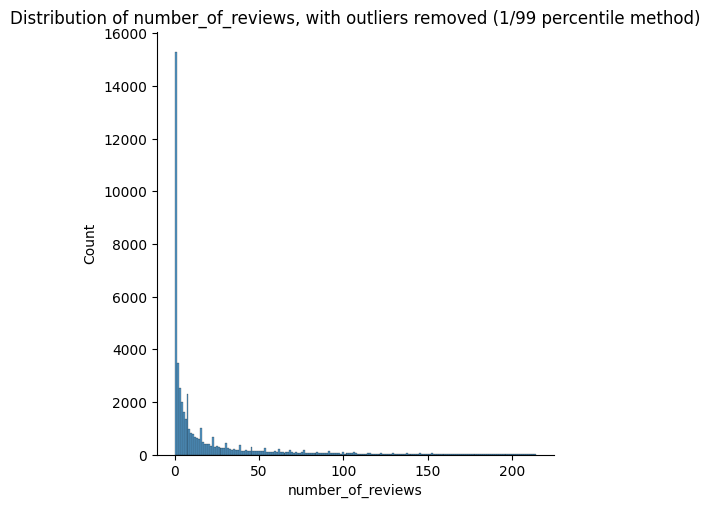

In [207]:
sns.displot(data[data.number_of_reviews_outliers_iqr.isnull()].number_of_reviews)
plt.title("Distribution of number_of_reviews, with outliers removed (IQR method)")


sns.displot(data[data.number_of_reviews_outliers_5_95.isnull()].number_of_reviews)
plt.title("Distribution of number_of_reviews, with outliers removed (5/95 percentile method)")

sns.displot(data[data.number_of_reviews_outliers_1_99.isnull()].number_of_reviews)
plt.title("Distribution of number_of_reviews, with outliers removed (1/99 percentile method)")

Although the data is heavily skewed, it is likely that those observations with higher values are legitimate, and that they hold relevant information regarding price. We can therefore keep them.

### Reviews per month

Review general distributions:

count    48884.000000
mean         1.090800
std          1.597213
min          0.000000
25%          0.040000
50%          0.370000
75%          1.580000
max         58.500000
Name: reviews_per_month, dtype: float64

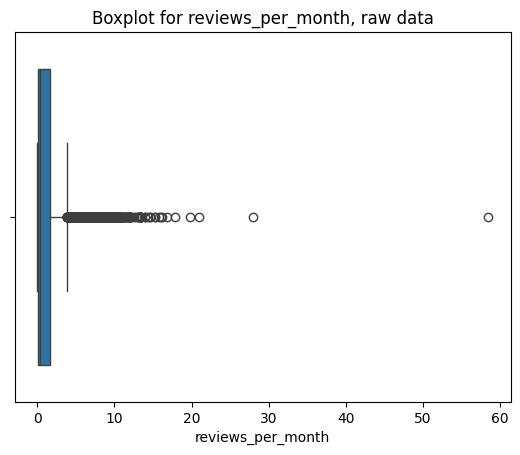

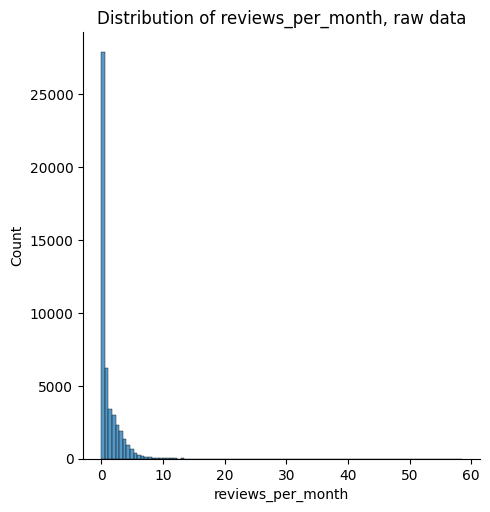

In [208]:
sns.boxplot(data,
            x="reviews_per_month")
# sns.stripplot(data, x="price",alpha=0.2, color="black")
plt.title("Boxplot for reviews_per_month, raw data")

sns.displot(data.reviews_per_month, bins=100)
plt.title("Distribution of reviews_per_month, raw data")


data.reviews_per_month.describe()

Data is also highly skewed. Let's check some possible outliers

In [209]:
data.nsmallest(9, "reviews_per_month", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'reviews_per_month','number_of_reviews', 'availability_365']]

,name,neighbourhood_group,room_type,price,minimum_nights,reviews_per_month,number_of_reviews,availability_365
2,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Private room,150,3,0.0,0,365
19,Huge 2 BR Upper East Cental Park,Manhattan,Entire home/apt,190,7,0.0,0,249
26,Magnifique Suite au N de Manhattan - vue Cloitres,Manhattan,Private room,80,4,0.0,0,0
36,Clean and Quiet in Brooklyn,Brooklyn,Private room,35,60,0.0,0,365
38,Country space in the city,Brooklyn,Private room,150,1,0.0,0,365
...,...,...,...,...,...,...,...,...
48890,Charming one bedroom - newly renovated rowhouse,Brooklyn,Private room,70,2,0.0,0,9
48891,Affordable room in Bushwick/East Williamsburg,Brooklyn,Private room,40,4,0.0,0,36
48892,Sunny Studio at Historical Neighborhood,Manhattan,Entire home/apt,115,10,0.0,0,27
48893,43rd St. Time Square-cozy single bed,Manhattan,Shared room,55,1,0.0,0,2


0 also seems like a reasonable value for this variable. Let's check maximum values

In [210]:
data.nlargest(9, "reviews_per_month", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'reviews_per_month','number_of_reviews', 'availability_365']]

,name,neighbourhood_group,room_type,price,minimum_nights,reviews_per_month,number_of_reviews,availability_365
42075,Enjoy great views of the City in our Deluxe Room!,Manhattan,Private room,100,1,58.50,156,299
42076,Great Room in the heart of Times Square!,Manhattan,Private room,199,1,27.95,82,299
38870,Lou's Palace-So much for so little,Queens,Private room,45,1,20.94,37,134
27287,JFK Comfort.5 Mins from JFK Private Bedroom & ...,Queens,Private room,80,1,19.75,403,26
28651,JFK 2 Comfort 5 Mins from JFK Private Bedroom,Queens,Private room,50,1,17.82,341,25
29628,JFK 3 Comfort 5 Mins from JFK Private Bedroom,Queens,Private room,50,1,16.81,302,26
20403,Cozy Room Family Home LGA Airport NO CLEANING FEE,Queens,Private room,48,1,16.22,510,341
22469,Cute Tiny Room Family Home by LGA NO CLEANING FEE,Queens,Private room,48,1,16.03,436,337
36238,“For Heaven Cakes”,Queens,Entire home/apt,75,1,15.78,132,28


Top values for reviews per month also seem reasonable, with the exception of 58.5 (which would suggest on average more than one guest per night). We might just keep assign this as 30.

In [211]:
data.reviews_per_month=np.where(data['reviews_per_month'] >30, 30, data['reviews_per_month'] )

### Availability 365

Review general distributions:

count    48884.000000
mean       112.779498
std        131.627271
min          0.000000
25%          0.000000
50%         45.000000
75%        227.000000
max        365.000000
Name: availability_365, dtype: float64

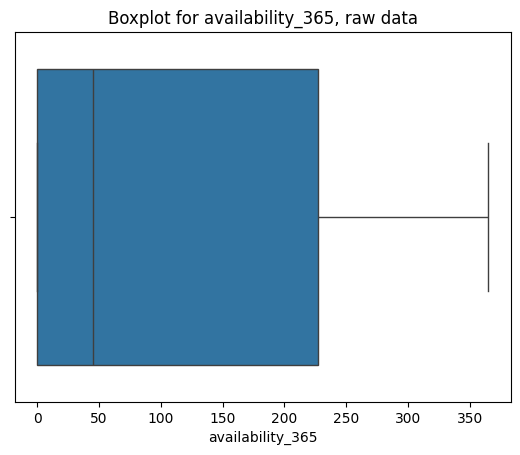

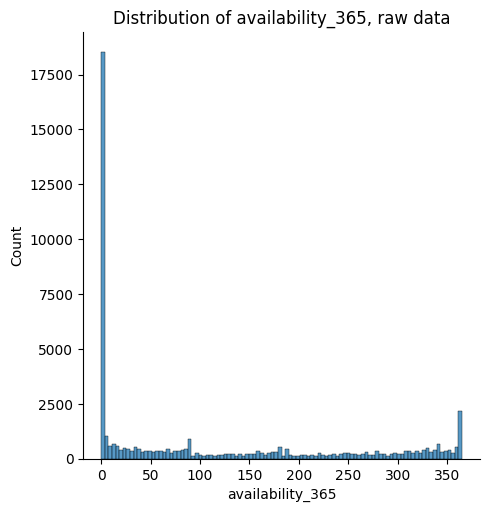

In [212]:
sns.boxplot(data,
            x="availability_365")
# sns.stripplot(data, x="price",alpha=0.2, color="black")
plt.title("Boxplot for availability_365, raw data")

sns.displot(data.availability_365, bins=100)
plt.title("Distribution of availability_365, raw data")


data.availability_365.describe()

Data is naturally restricted by 365 maximum bound. As previously noted, there are also a large number of listings with 0 availability, for which we have created a new binary variable. It would make sense therefore to remove values of 0 as this information is already captured in the other variable, and might obscure more subtle relationships between availability and price for listings which are actually available.

However, assigning 0 as missing values might create issues in linear regression model, so we'll leave it as is.

In [213]:
# data.availability_365=data.availability_365.replace(0, np.NaN)

# data.availability_365=data.availability_365.replace(np.NaN, 0)

Replotting distribution after transformation

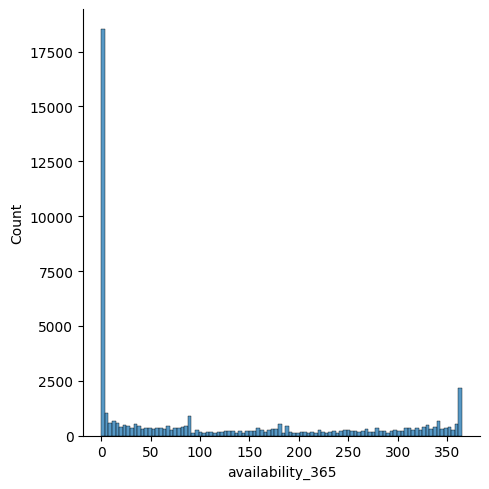

In [214]:
sns.displot(data.availability_365, bins=100)

### Host listing count

Review general distributions:

count    48884.000000
mean         7.144628
std         32.956185
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max        327.000000
Name: calculated_host_listings_count, dtype: float64

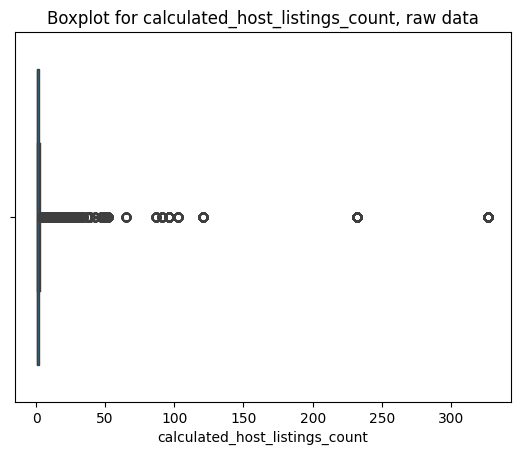

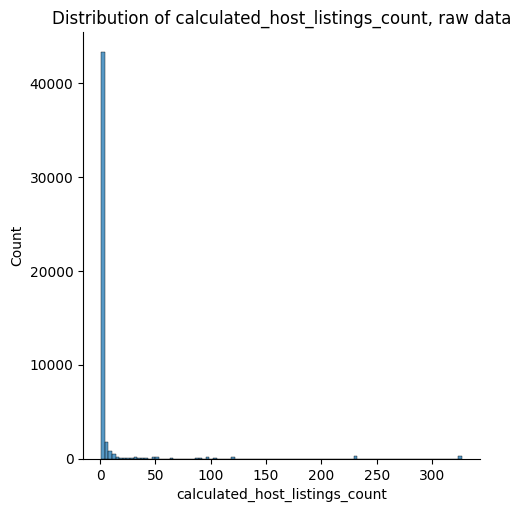

In [215]:
sns.boxplot(data,
            x="calculated_host_listings_count")
# sns.stripplot(data, x="price",alpha=0.2, color="black")
plt.title("Boxplot for calculated_host_listings_count, raw data")

sns.displot(data.calculated_host_listings_count, bins=100)
plt.title("Distribution of calculated_host_listings_count, raw data")


data.calculated_host_listings_count.describe()

Data is also highly skewed. Let's check some possible outliers

In [216]:
data.nsmallest(9, "calculated_host_listings_count", keep="all")[['name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'reviews_per_month','number_of_reviews', 'availability_365', 'calculated_host_listings_count']]

,name,neighbourhood_group,room_type,price,minimum_nights,reviews_per_month,number_of_reviews,availability_365,calculated_host_listings_count
2,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Private room,150,3,0.00,0,365,1
3,Cozy Entire Floor of Brownstone,Brooklyn,Entire home/apt,89,1,4.64,270,194,1
4,Entire Apt: Spacious Studio/Loft by central park,Manhattan,Entire home/apt,80,10,0.10,9,0,1
5,Large Cozy 1 BR Apartment In Midtown East,Manhattan,Entire home/apt,200,3,0.59,74,129,1
6,BlissArtsSpace!,Brooklyn,Private room,60,45,0.40,49,0,1
...,...,...,...,...,...,...,...,...,...
48884,Brooklyn Oasis in the heart of Williamsburg,Brooklyn,Private room,190,7,0.00,0,341,1
48886,Comfy 1 Bedroom in Midtown East,Manhattan,Entire home/apt,200,6,0.00,0,176,1
48888,"Spacious Room w/ Private Rooftop, Central loca...",Manhattan,Private room,125,4,0.00,0,31,1
48892,Sunny Studio at Historical Neighborhood,Manhattan,Entire home/apt,115,10,0.00,0,27,1


Minimum 1 seems reasonable.

In [217]:
data.nlargest(9, "calculated_host_listings_count", keep="all")[['host_name','name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'reviews_per_month','number_of_reviews', 'availability_365', 'calculated_host_listings_count']]

,host_name,name,neighbourhood_group,room_type,price,minimum_nights,reviews_per_month,number_of_reviews,availability_365,calculated_host_listings_count
38293,Sonder (NYC),Sonder | 180 Water | Incredible 2BR + Rooftop,Manhattan,Entire home/apt,302,29,0.00,0,309,327
38294,Sonder (NYC),Sonder | 180 Water | Premier 1BR + Rooftop,Manhattan,Entire home/apt,229,29,0.73,1,219,327
38588,Sonder (NYC),Sonder | 180 Water | Charming 1BR + Rooftop,Manhattan,Entire home/apt,232,29,0.60,1,159,327
39769,Sonder (NYC),Sonder | The Nash | Artsy 1BR + Rooftop,Manhattan,Entire home/apt,262,2,1.86,8,91,327
39770,Sonder (NYC),Sonder | The Nash | Lovely Studio + Rooftop,Manhattan,Entire home/apt,255,2,2.59,14,81,327
...,...,...,...,...,...,...,...,...,...,...
47691,Sonder (NYC),Sonder | 116 John | Vibrant Studio + Fitness Room,Manhattan,Entire home/apt,135,29,0.00,0,339,327
47692,Sonder (NYC),Sonder | 116 John | Vibrant 1BR + Fitness Room,Manhattan,Entire home/apt,165,29,0.00,0,342,327
47693,Sonder (NYC),Sonder | 116 John | Stunning 1BR + Rooftop,Manhattan,Entire home/apt,165,29,0.00,0,347,327
47814,Sonder (NYC),Sonder | 116 John | Polished Studio + Gym,Manhattan,Entire home/apt,699,29,0.00,0,327,327


In [218]:
data.groupby(['host_id', 'host_name']).size().nlargest()

host_id    host_name   
219517861  Sonder (NYC)    327
107434423  Blueground      232
30283594   Kara            121
137358866  Kazuya          103
12243051   Sonder           96
dtype: int64

In [219]:
data.query("host_id==107434423")[['host_name','name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'reviews_per_month','number_of_reviews', 'availability_365', 'calculated_host_listings_count']]

,host_name,name,neighbourhood_group,room_type,price,minimum_nights,reviews_per_month,number_of_reviews,availability_365,calculated_host_listings_count
26137,Blueground,"Homey Midtown East 1BR w/ Gym, Doorman, near t...",Manhattan,Entire home/apt,308,30,0.00,0,156,232
29128,Blueground,"Calming FiDi 1BR w/ lux Gym, Speakeasy + Doorm...",Manhattan,Entire home/apt,271,30,0.09,1,310,232
30158,Blueground,"Mod Midtown East 1BR w/ Gym, walk to Grand Cen...",Manhattan,Entire home/apt,289,30,0.00,0,223,232
30428,Blueground,"Posh Park Avenue 1BR w/ Gym, Doorman in Midtow...",Manhattan,Entire home/apt,305,30,0.17,1,326,232
31506,Blueground,"Luxury Tribeca 1BR w/ Gym, Doorman + Roof deck...",Manhattan,Entire home/apt,323,30,0.00,0,316,232
...,...,...,...,...,...,...,...,...,...,...
48723,Blueground,Smart Nolita 1BR w/ W/D near famous cafes by B...,Manhattan,Entire home/apt,316,30,0.00,0,325,232
48724,Blueground,Dapper Hell's Kitchen 2BR w/ Gym + W/D + Door...,Manhattan,Entire home/apt,385,30,0.00,0,338,232
48725,Blueground,Trendy Hell's Kitchen 1BR w/ Gym + W/D + Doorm...,Manhattan,Entire home/apt,267,30,0.00,0,228,232
48726,Blueground,Beautiful Williamsburg 2BR w/ Skyline views + ...,Brooklyn,Entire home/apt,278,30,0.00,0,188,232


In [220]:
data.query("host_id==30283594")[['host_name','name', 'neighbourhood_group', 'room_type', 'price', 'minimum_nights', 'reviews_per_month','number_of_reviews', 'availability_365', 'calculated_host_listings_count']]

,host_name,name,neighbourhood_group,room_type,price,minimum_nights,reviews_per_month,number_of_reviews,availability_365,calculated_host_listings_count
9740,Kara,NYC Lavish Studio Apartment Steps from SoHo!,Manhattan,Entire home/apt,169,30,0.09,3,364,121
10075,Kara,Furnished NYC 1BR apt near Rockefeller Center!!!,Manhattan,Entire home/apt,135,30,0.00,0,174,121
10335,Kara,LUX 1-Bedroom NYC Apartment Near Times Square!,Manhattan,Entire home/apt,369,30,0.00,0,364,121
10398,Kara,NYC High End 2BR Midtown West Apt,Manhattan,Entire home/apt,335,30,0.00,0,201,121
10490,Kara,NYC Chelsea Luxury 1BR Apt,Manhattan,Entire home/apt,129,30,0.07,3,161,121
...,...,...,...,...,...,...,...,...,...,...
42128,Kara,Gorgeous 1 BR apt in NYC with breathtaking views!,Manhattan,Entire home/apt,302,30,0.00,0,364,121
42129,Kara,"Modern, Deluxe 1 bedroom apt in prime of NYC!",Manhattan,Entire home/apt,350,30,0.00,0,364,121
42130,Kara,Heart of NYC- deluxe 1BR apt with gorgeous views,Manhattan,Entire home/apt,350,30,0.00,0,364,121
48529,Kara,Lavish 1br apartment in New York's Upper East ...,Manhattan,Entire home/apt,269,30,0.00,0,333,121


Top hosts with most listing counts also seem like possible enterprises, and a brief check of listing names suggests that these might be correctly assigned. Therefore variable seems correctly coded, ans possibly no need to remove outliers (bearing in mind that these would also lead to removal of large numbers of listings givent the number of listings per host).

## Conclusion

Several outlier exploration and detection approaches were applied. The only two variables where we identified that wide outlier handling seeemed beneficial were price and minimum nights. In order to keep our approach consistent, it would make sense to chose the same outlier detection approach for both variables. Given the results above, the most suitable approach seems to be the 1/99 percentiles. As for triming vs Winsoring, Winsoring seems like a reasonable approach here and we will apply this to both variables.

In conclusion, data transformations for candidate model variables were applied as below:
- **price**: remove observations with price 0, apply 1/99 percentile approach to identify outliers
- **minimum nights**: apply 1/99 percentile approach to identify outliers, but only with 99 percentile (values below 1st percentile are reasonable ones)
- **number of reviews**: keep all values
- **reviews per month**: assign one observation with average ~57 to 30
- **availability_365**: remove values with 0 and replace with missing
- **availability (binary)**: created from availability_365
- **host listing count**: no transformations applied
- **time since last review**: calculated from date of last review (vs likely date of data extraction)

In [221]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 48884 entries, 0 to 48894
Data columns (total 28 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   id                               48884 non-null  int64         
 1   name                             48868 non-null  object        
 2   host_id                          48884 non-null  int64         
 3   host_name                        48863 non-null  object        
 4   neighbourhood_group              48884 non-null  object        
 5   neighbourhood                    48884 non-null  object        
 6   latitude                         48884 non-null  float64       
 7   longitude                        48884 non-null  float64       
 8   room_type                        48884 non-null  object        
 9   price                            48884 non-null  int64         
 10  minimum_nights                   48884 non-null  int64         

### Final winsorising step

In [222]:
data.price=winsorize(data.price, limits=[0.01,0.01])

data.minimum_nights=winsorize(data.minimum_nights, limits=[0.00,0.01])




In [223]:
# removing columns created above with outlier flags

data = data[data.columns.drop(data.filter(regex='outlier').columns.tolist())]

Text(0.5, 1.0, 'Minimum nights distribution, after Winsoring (0/99 percentiles)')

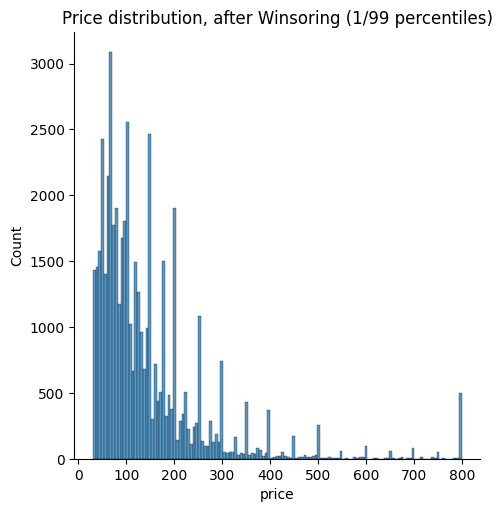

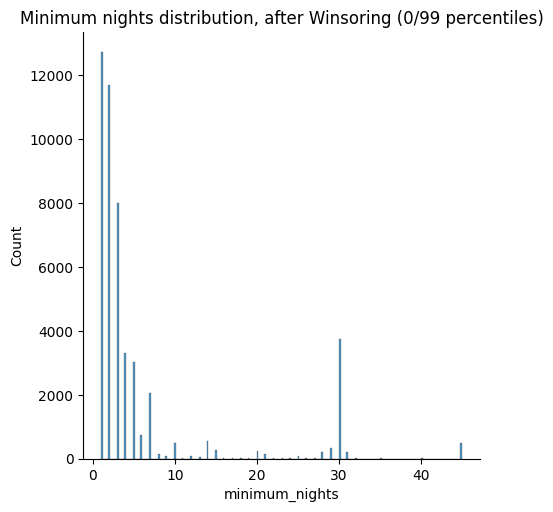

In [224]:
sns.displot(data.price)
plt.title("Price distribution, after Winsoring (1/99 percentiles)")

sns.displot(data.minimum_nights)
plt.title("Minimum nights distribution, after Winsoring (0/99 percentiles)")


# Modelling

The aim is to build a predictive model for price, based on listing characteristics.  
This model can be used for two purposes:  
- to help hosts know what the average price would be for a listing similar to theirs, and use this to set a price (p.e. lower if wanting to make sure they got a booking and in a quick timeframe; higher if they can wait or know their listing is special in some way, and are aiming for higher profit)
- to help AirBNB find "outstanding" or overperforming listings, based on the difference between predicted listing price and actual confirmed booking price (or, conversely, underperforming listings), and explore these patterns to help build support programs for underperforming hosts based on the features that drive high performance.  

Dependent/target variable:
- price

Independent/predictor variables (candidates):
- host_id
- neighbourhood_group
- neighbourhood
- room_type
- minimum_nights
- number_of_reviews
- calculated_host_listings_count
- availability_365




## Building initial model

In [225]:
# Select variables of interest and one-hot encode categorical variables
data_encoded = pd.get_dummies(data[['price',
                   'host_id',
                   'neighbourhood_group',
                   'neighbourhood',
                   'room_type',
                   'minimum_nights',
                   'number_of_reviews',
                   'reviews_per_month',
                   'calculated_host_listings_count',
                   'availability_365',
                   'available_binary']],
                              columns=['room_type',
                                       'neighbourhood_group',
                                       'neighbourhood'],
                              drop_first=True)


# Select features and target variable
X = data_encoded.drop('price', axis=1)
y = data_encoded['price']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create and train the regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate and print regression model metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Root mean squared error (RMSE): {math.sqrt(mse)}")
print(f"R-squared: {r2}")


# calculate p-values for each component
f_statistic, p_values=f_regression(X,y)

# p_values


# Display regression coefficients and p-values (for univariate regression for each component vs price)
coefficients = pd.DataFrame({"Feature": X.columns,
                             "Coefficient": model.coef_,
                             "p-value":p_values}).\
                                   round(4)

print("Regression Coefficients:\n", coefficients)


Root mean squared error (RMSE): 97.37798803570979
R-squared: 0.34621499048105064
Regression Coefficients:
                             Feature  Coefficient  p-value
0                           host_id       0.0000   0.0000
1                    minimum_nights      -1.6038   0.0000
2                 number_of_reviews      -0.1246   0.0000
3                 reviews_per_month      -5.2056   0.0000
4    calculated_host_listings_count      -0.0084   0.0000
..                              ...          ...      ...
228   neighbourhood_Windsor Terrace       5.3394   0.6038
229         neighbourhood_Woodhaven     -25.6306   0.0000
230          neighbourhood_Woodlawn     -17.6677   0.0225
231           neighbourhood_Woodrow       0.0000   0.0000
232          neighbourhood_Woodside       3.3169   0.0000

[233 rows x 3 columns]


## Checking model assumptions

- Absence of multicollinearity (no strong correlation between predictor variables)
- Linear relationship between predictor and target variables
- Normally distributed residuals
- Homocedasticity: homogeneous residual variance across levels of the independent variable

Check reference [here](https://pubmed.ncbi.nlm.nih.gov/39507810/#full-view-affiliation-1)





### Assumption 1: Absence of multicollinearity

In [226]:
# create new dataset with variables of interest for model

features=data[['price',
                   'host_id',
                   'neighbourhood_group',
                   'neighbourhood',
                   'room_type',
                   'minimum_nights',
                   'number_of_reviews',
                   'reviews_per_month',
                   'calculated_host_listings_count',
                   'availability_365',
                   'available_binary']]

# extract variable names
feature_names=features.columns

# extract list of numerical variables to check assumptions
feature_names_numeric=features[[
    #'price',
                   'host_id',
                   # 'neighbourhood_group',
                   # 'neighbourhood',
                   # 'room_type',
                   'minimum_nights',
                   'number_of_reviews',
                   'reviews_per_month',
                   'calculated_host_listings_count',
                   'availability_365',
                   # 'available_binary'
                   ]].columns


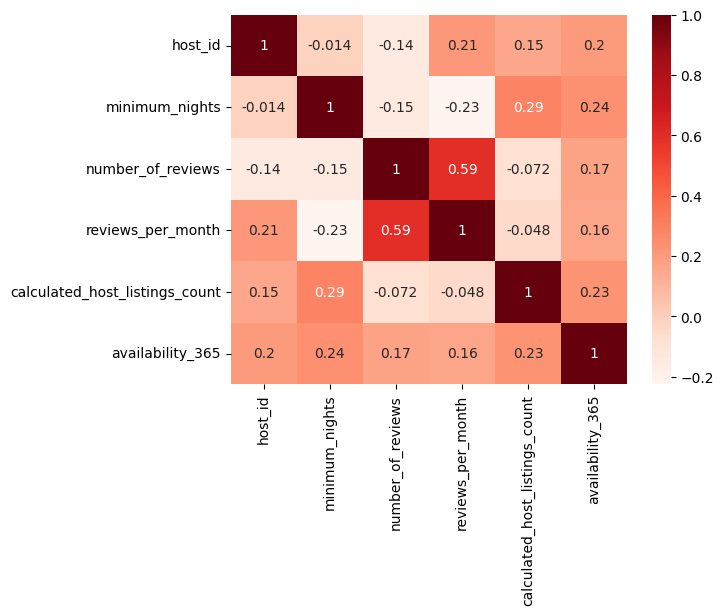

Variance Inflation Factors (VIF)
> 10: An indication that multicollinearity may be present
> 100: Certain multicollinearity among the variables
-------------------------------------
host_id: 1.8188363914811798
minimum_nights: 1.47169030734198
number_of_reviews: 2.1997641162790273
reviews_per_month: 2.6713166885101085
calculated_host_listings_count: 1.1909291547790861
availability_365: 2.010322084649356

0 cases of possible multicollinearity
0 cases of definite multicollinearity

Assumption satisfied


In [227]:

corrMatrix = features[feature_names_numeric].corr()

sns.heatmap(corrMatrix, annot = True, cmap= 'Reds')
plt.show()

print('Variance Inflation Factors (VIF)')
print('> 10: An indication that multicollinearity may be present')
print('> 100: Certain multicollinearity among the variables')
print('-------------------------------------')
# Gathering the VIF for each variable
VIF = [variance_inflation_factor(features[feature_names_numeric], i)
       for i in range(features[feature_names_numeric].shape[1])]

for idx, vif in enumerate(VIF):
  print('{0}: {1}'.format(feature_names_numeric[idx], vif))


# Gathering and printing total cases of possible or definite multicollinearity
possible_multicollinearity = sum([1 for vif in VIF if vif > 10])
definite_multicollinearity = sum([1 for vif in VIF if vif > 100])
print()
print('{0} cases of possible multicollinearity'.format(possible_multicollinearity))
print('{0} cases of definite multicollinearity'.format(definite_multicollinearity))
print()
if definite_multicollinearity == 0:
  if possible_multicollinearity == 0:
    print('Assumption satisfied')
  else:
    print('Assumption possibly satisfied')
    print()
    print('Coefficient interpretability may be problematic')
    print('Consider removing variables with a high Variance Inflation Factor (VIF)')
else:
  print('Assumption not satisfied')
  print()
  print('Coefficient interpretability will be problematic')
  print('Consider removing variables with a high Variance Inflation Factor (VIF)')

Based on the assessment above, we can be satisfied that no strong multicollinearity exists between the features included in the model.

### Assumption 2: Linear relationship between predictor and target variables

If there is only one predictor, this is easy to test with a scatter plot. However, we have a multiple regression model, so we'll have to modify this by using a scatter plot to see our predicted values versus the actual values (the residuals).


Residual Calculation
   Actual   Predicted   Residuals
0     149  102.265538   46.734462
1     225  342.009633 -117.009633
2     150  126.818878   23.181122
3      89  160.348173  -71.348173
4      80  153.077468  -73.077468




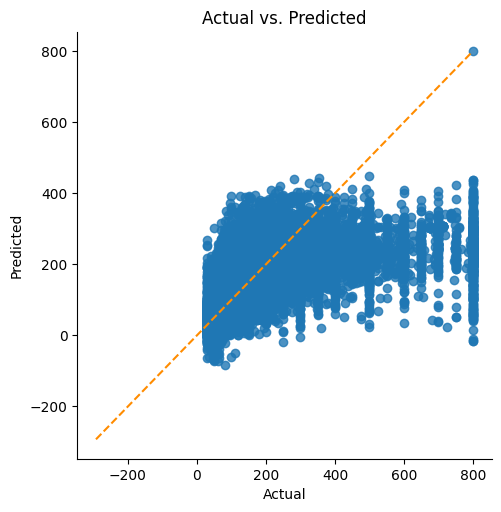

In [228]:
# Initializing Variable name like model, independent features and label name in the dataset
label = data_encoded.price
features=data_encoded.drop('price', axis=1)

# Prediction and a table of Actual vs Predicted
predictions = model.predict(features)
df_results = pd.DataFrame({'Actual': label, 'Predicted': predictions})


# Calculating Residuals
df_results['Residuals'] = abs(df_results['Actual']) - abs(df_results['Predicted'])
print("Residual Calculation")
print(df_results.head())
print("\n")

# Plotting the actual vs predicted values
sns.lmplot(x='Actual', y='Predicted', data=df_results, fit_reg=False)

# Plotting the diagonal line
line_coords = np.arange(df_results.min().min(), df_results.max().max())
plt.plot(line_coords, line_coords,  # X and y points
color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted')
plt.show()

# Inference :
# We can see in this case that there is not a perfect linear relationship.
# Our predictions are biased towards lower values for values >400


This assessment shows that the model is underperforming for input values >400, with predictions grossly underestimated. This violates the assumptions for linear regression models, with possible solutions including adding polynomial terms to some of the predictors/applying nonlinear transformations, or else adding additional variables to help capture the relationship between the predictors and the label. The first two are outside the scope of this exercise, and the latter is not possible given the limited data we have available, so we'll keep the model as it is but acknowledging the limitation.

### Assumption 3: Normally distributed residuals

Using the Anderson-Darling test for normal distribution
p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


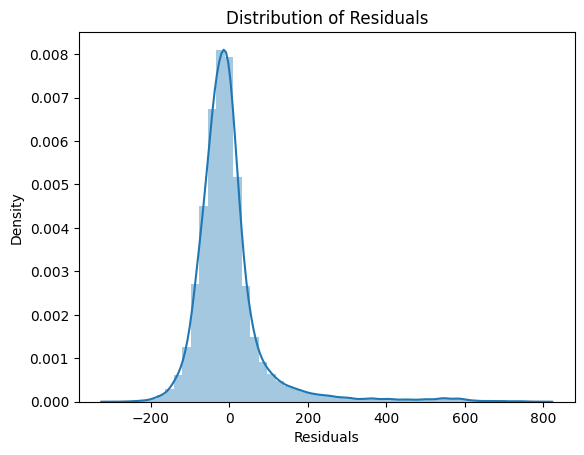


Assumption not satisfied

Confidence intervals will likely be affected
Try performing nonlinear transformations on variables
Skewness of RESIDUAL : 3.204344500742784
Residual is Positive skewed


In [229]:
print('Using the Anderson-Darling test for normal distribution')

# Performing the test on the residuals
p_value = normal_ad(df_results['Residuals'])[1]
print('p-value from the test - below 0.05 generally means non-normal:', p_value)
# Reporting the normality of the residuals
p_value_thresh=0.05
if p_value < p_value_thresh:
  print('Residuals are not normally distributed')
else:
  print('Residuals are normally distributed')
    # Plotting the residuals distribution
# plt.subplots(figsize=(12, 6))
plt.title('Distribution of Residuals')
sns.distplot(df_results['Residuals'])
plt.show()
print()

if p_value > p_value_thresh:
  print('Assumption satisfied')
else:
  print('Assumption not satisfied')
  print()
  print('Confidence intervals will likely be affected')
  print('Try performing nonlinear transformations on variables')

# Check for another one variable
print("Skewness of RESIDUAL :",df_results['Residuals'].skew())
if df_results['Residuals'].skew() > 1:
  print('Residual is Positive skewed')
elif df_results['Residuals'].skew() < -1:
  print('Residual is Negative skewed')
else:
  print('Residual is not skewed')

# Inference :
# This isn’t ideal, and we can see that our model is biasing towards under-estimating

This assessment highlights that we have a large number of residuals with very high values (i.e. actual - predicted price). The underlying cause is probably the non-linear relationships seen in the bivariate data exploration. We can try and tackle this by transforming price using a log10 transformation and reassessing distributions, variable relationships, and model performance and assumptions

## Rebuilding model with price transformed as log10



In [230]:
# Select variables of interest and one-hot encode categorical variables
data_encoded = pd.get_dummies(data[['price',
                   'host_id',
                   'neighbourhood_group',
                   'neighbourhood',
                   'room_type',
                   'minimum_nights',
                   'number_of_reviews',
                   'reviews_per_month',
                   'calculated_host_listings_count',
                   'availability_365',
                   'available_binary']],
                              columns=['room_type',
                                       'neighbourhood_group',
                                       'neighbourhood'],
                              drop_first=True)

# transform price to log 10 (after having excluded outliers previously)
data_encoded.price=np.log10(data_encoded["price"])




In [231]:
# run updated model


# Select features and target variable
X = data_encoded.drop('price', axis=1)
y = data_encoded['price']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create and train the regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate and print regression model metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Root mean squared error (RMSE): {pow(10,math.sqrt(mse)):.2f} (after inverting log10)")
print(f"R-squared: {r2}")


# calculate p-values for each component
f_statistic, p_values=f_regression(X,y)

# p_values


# Display regression coefficients and p-values (for univariate regression for each component vs price)
coefficients = pd.DataFrame({"Feature": X.columns,
                             "Coefficient": model.coef_,
                             "p-value":p_values}).\
                                   round(4)

print("Regression Coefficients:\n", coefficients)

Root mean squared error (RMSE): 1.55 (after inverting log10)
R-squared: 0.5683669875624424
Regression Coefficients:
                             Feature  Coefficient  p-value
0                           host_id       0.0000   0.0002
1                    minimum_nights      -0.0048   0.0000
2                 number_of_reviews      -0.0002   0.0000
3                 reviews_per_month      -0.0111   0.0000
4    calculated_host_listings_count       0.0000   0.0000
..                              ...          ...      ...
228   neighbourhood_Windsor Terrace       0.0383   0.3508
229         neighbourhood_Woodhaven      -0.1178   0.0000
230          neighbourhood_Woodlawn      -0.0559   0.0008
231           neighbourhood_Woodrow       0.0000   0.0067
232          neighbourhood_Woodside      -0.0072   0.0000

[233 rows x 3 columns]


In [232]:
print(f"We can see an substantial improvement in model performance, with R2 increasing from 0.346 to 0.568, and RMSE decreasing from 97.3 to {pow(10,0.19):.2f}")

We can see an substantial improvement in model performance, with R2 increasing from 0.346 to 0.568, and RMSE decreasing from 97.3 to 1.55


## Checking model assumptions (for rebuilt model)

### Assumption 1: Absence of multicollinearity

No need to recheck as we only transformed the target variable

### Assumption 2: Linear relationship between predictor and target variables



Residual Calculation
     Actual  Predicted  Residuals
0  2.173186   1.866528   0.306658
1  2.352183   2.553658  -0.201475
2  2.176091   1.975151   0.200940
3  1.949390   2.176463  -0.227073
4  1.903090   2.134975  -0.231885




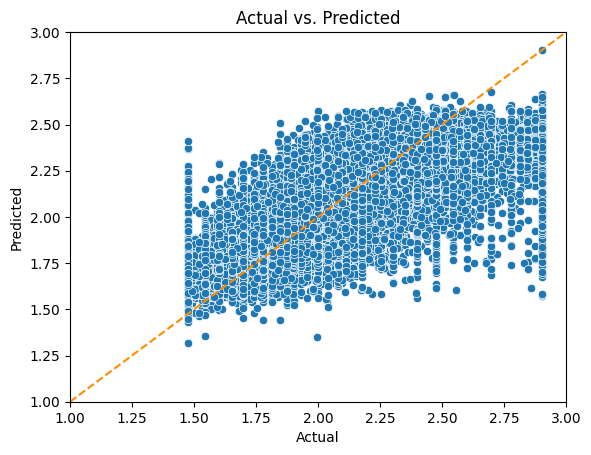

In [233]:
# Initializing Variable name like model, independent features and label name in the dataset
label = data_encoded.price
features=data_encoded.drop('price', axis=1)

# Prediction and a table of Actual vs Predicted
predictions = model.predict(features)
df_results = pd.DataFrame({'Actual': label, 'Predicted': predictions})


# Calculating Residuals
df_results['Residuals'] = abs(df_results['Actual']) - abs(df_results['Predicted'])
print("Residual Calculation")
print(df_results.head())
print("\n")

# Plotting the actual vs predicted values
ax=sns.scatterplot(x='Actual', y='Predicted', data=df_results)
ax.set_xlim(1,3)
ax.set_ylim(1,3)


# Plotting the diagonal line

plt.title('Actual vs. Predicted')
plt.plot(np.linspace(1, 3, 100), np.linspace(1, 3, 100),  # X and y points
color='darkorange', linestyle='--')

plt.show()


# Inference :
# The relationship is not perfect, but seems much improved from previously


### Assumption 3: Normally distributed residuals

Using the Anderson-Darling test for normal distribution
p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed

Assumption not satisfied

Confidence intervals will likely be affected
Try performing nonlinear transformations on variables
Skewness of RESIDUAL : 0.939528208691156
Residual is not skewed


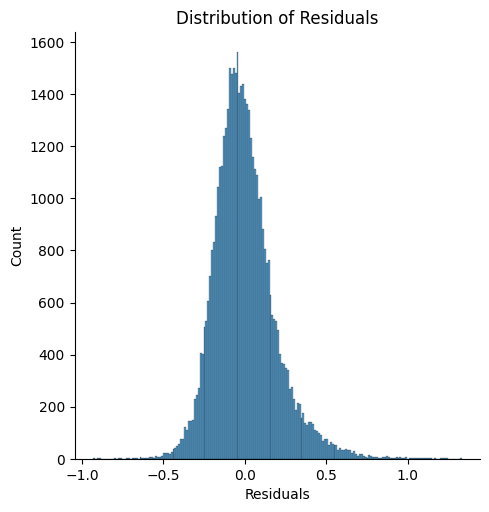

In [234]:
print('Using the Anderson-Darling test for normal distribution')

# Performing the test on the residuals
p_value = normal_ad(df_results['Residuals'])[1]
print('p-value from the test - below 0.05 generally means non-normal:', p_value)
# Reporting the normality of the residuals
p_value_thresh=0.05
if p_value < p_value_thresh:
  print('Residuals are not normally distributed')
else:
  print('Residuals are normally distributed')
    # Plotting the residuals distribution
ax=sns.displot(df_results['Residuals'])
ax.set(title='Distribution of Residuals')

print()

if p_value > p_value_thresh:
  print('Assumption satisfied')
else:
  print('Assumption not satisfied')
  print()
  print('Confidence intervals will likely be affected')
  print('Try performing nonlinear transformations on variables')

# Check for another one variable
print("Skewness of RESIDUAL :",df_results['Residuals'].skew())
if df_results['Residuals'].skew() > 1:
  print('Residual is Positive skewed')
elif df_results['Residuals'].skew() < -1:
  print('Residual is Negative skewed')
else:
  print('Residual is not skewed')

# Inference :
# This isn’t ideal, and we can see that our model is biasing towards under-estimating

We can now see a much better distribution of residuals, even if not perfect (there is still some right-skewness)

### Assumption 4: Homoscedasticity

Homoscedasticity means the same variance within our error terms (residuals).

Assumption 5: Homoscedasticity of Error Terms: Residuals should have relative constant variance


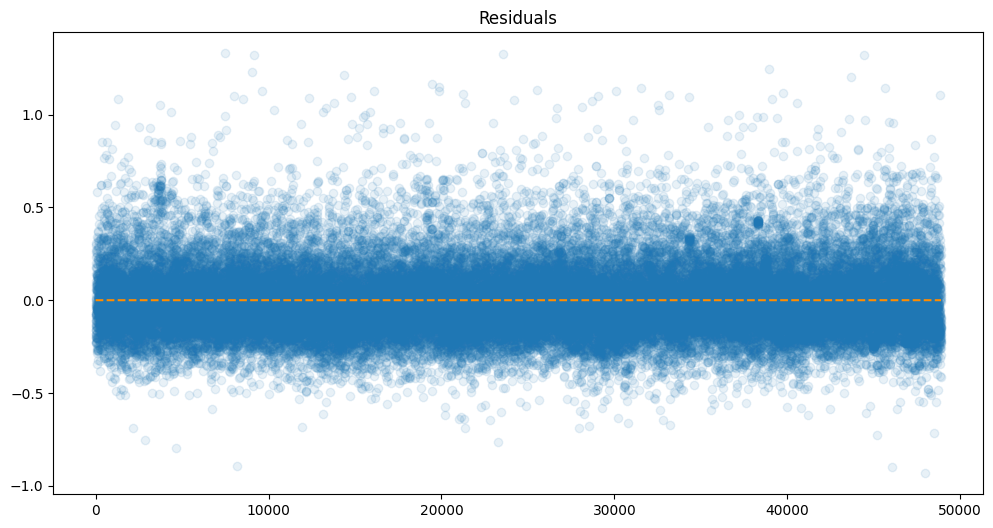

In [235]:
print('Assumption 5: Homoscedasticity of Error Terms: Residuals should have relative constant variance')
# Plotting the residuals
plt.subplots(figsize=(12, 6))
ax = plt.subplot(111)  # To remove spines
plt.scatter(x=df_results.index, y=df_results.Residuals, alpha=0.1)
plt.plot(np.repeat(0, df_results.index.max()), color='darkorange', linestyle='--')
plt.title('Residuals')
plt.show()



While not perfect, we cannot see any obvious consistent deviation from a fully uniform variance across our residuals, so it is reasonable to conclude that this assumption is met.

## Investigating important predictors



In [236]:
coefficients.nlargest(50, 'Coefficient',keep="all")

,Feature,Coefficient,p-value
94,neighbourhood_Fort Wadsworth,0.7747,0.0037
33,neighbourhood_Breezy Point,0.4996,0.1045
179,neighbourhood_Riverdale,0.4351,0.0225
10,neighbourhood_group_Manhattan,0.3126,0.0000
186,neighbourhood_Sea Gate,0.3095,0.0261
26,neighbourhood_Belle Harbor,0.2794,0.1985
110,neighbourhood_Holliswood,0.2649,0.7756
227,neighbourhood_Willowbrook,0.2613,0.2393
209,neighbourhood_Tribeca,0.2406,0.0000
65,neighbourhood_DUMBO,0.2300,0.0000


The most importance predictors in our model (based on the regression coefficients) seem to all be related to location (both broad neighbourhood group and specific neighbourhoods).  
Let's now investigate further, excluding individual neighbourhoods



In [237]:
coefficients.query("('host_id', 'room_type', 'minimum_nights','number_of_reviews','room_type_Private room', 'room_type_Shared room','reviews_per_month','calculated_host_listings_count','availability_365','available_binary','neighbourhood_group_Queens','neighbourhood_group_Manhattan', 'neighbourhood_group_Brooklyn','neighbourhood_group_Staten Island') in Feature").sort_values('Coefficient',ascending=False)


,Feature,Coefficient,p-value
10,neighbourhood_group_Manhattan,0.3126,0.0000
9,neighbourhood_group_Brooklyn,0.1465,0.0000
11,neighbourhood_group_Queens,0.0981,0.0000
6,available_binary,0.0426,0.0000
12,neighbourhood_group_Staten Island,0.0420,0.0000
5,availability_365,0.0003,0.0000
0,host_id,0.0000,0.0002
4,calculated_host_listings_count,0.0000,0.0000
2,number_of_reviews,-0.0002,0.0000
1,minimum_nights,-0.0048,0.0000


We can see that all these predictors are highly-statistically significant. Interpretation of the coefficients is made difficult by the log10 transformation applied to price, but if we rerun the coefficients from the initial model we can have a sense of the impact of each of these predictors

In [238]:
# Select variables of interest and one-hot encode categorical variables
data_encoded = pd.get_dummies(data[['price',
                   'host_id',
                   'neighbourhood_group',
                   'neighbourhood',
                   'room_type',
                   'minimum_nights',
                   'number_of_reviews',
                   'reviews_per_month',
                   'calculated_host_listings_count',
                   'availability_365',
                   'available_binary']],
                              columns=['room_type',
                                       'neighbourhood_group',
                                       'neighbourhood'],
                              drop_first=True)


# Select features and target variable
X = data_encoded.drop('price', axis=1)
y = data_encoded['price']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create and train the regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate and print regression model metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


# calculate p-values for each component
f_statistic, p_values=f_regression(X,y)

# p_values


# Display regression coefficients and p-values (for univariate regression for each component vs price)
coefficients_original = pd.DataFrame({"Feature": X.columns,
                             "Coefficient": model.coef_,
                             "p-value":p_values}).\
                                   round(4)
print("Coefficients from original model (with price as $)")
coefficients_original.query("('host_id', 'room_type', 'minimum_nights','room_type_Private room', 'room_type_Shared room','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','available_binary','neighbourhood_group_Queens','neighbourhood_group_Manhattan', 'neighbourhood_group_Brooklyn','neighbourhood_group_Staten Island') in Feature").sort_values('Coefficient',ascending=False)


Coefficients from original model (with price as $)


,Feature,Coefficient,p-value
10,neighbourhood_group_Manhattan,99.9463,0.0
9,neighbourhood_group_Brooklyn,38.5689,0.0
11,neighbourhood_group_Queens,20.0417,0.0
6,available_binary,13.8079,0.0
12,neighbourhood_group_Staten Island,11.6109,0.0
5,availability_365,0.1310,0.0
0,host_id,0.0000,0.0
4,calculated_host_listings_count,-0.0084,0.0
2,number_of_reviews,-0.1246,0.0
1,minimum_nights,-1.6038,0.0


# Conclusion

We have built a linear regression model to predict price for the listings contained in the AirBNB dataset.  
The model includes a number of features, namely:
- neighbourhood group
- individual neighbourhood
- room type
- minimum nights per booking
- total number of reviews
- average number of reviews per month
- total availability over the year
- current availability (yes/no)
- individual host id
- number of listings per host

The model has a moderate predictive capability, shown by an R-squared of 0.568 (indicating that the model is able to account for 57% of the variance within the underlying price values), and a root-mean-squared error of 1.55 dollars. We have also seen that the model tends to underperform for listings with higher prices, suggesting that price for those listings is determined by a significant extent by information that is not included in the model.  
The most important predictors seemed to be those related to location (both broad neighbourhood groups and individual neighbourhoods). In particulary, listings in Manhattan were on average 99.9 dollars more expensive, those in Brooklyn 38.5 dollars more expensive, those in Queens 20 dollars more expensive, and those in Staten Island 11.6 dollars more expensive than those in Bronx (the reference term in our model). Higher availability was generally associated with higher prices (average 13.8 dollars increase for currently available listings versus those not available, and 0.13 dollars increase for additional day available). All other model features were negativelly associated with price, namely:  
- a small (less than 0.01 dollars) decrease in price for each additional total number of listings per host  
- a 0.12 dollars decrease in price for each additional total number of reviews
- a 1.6 dollars decrease in price for each additional minimum number of nights per booking
- a 5.2 dollars decrease in price for each additional average number of reviews per month
- a 94.8 dollars decrease in price for a private room and a 123.9 dollars decrease in price for a shared room versus an entire appartment (the reference term in the model)

These estimates indicate that potential hosts can try to increase their gains by purchasing properties in locations which are highly sought after (which can be investigated in detail from our model), by trying to convert shared room or private room listings to entire appartments, by increasing the proportion of days within a year during which their property is available for booking, and by reducing the minimum number of nights for each booking. This model can also be used to provide an estimate of the average price for properties within the same characteritics, helping AirBNB and hosts have a better sense of how much they might be able to charge for each listing.    